# **Machine Learning Reconstruction of Surface Ocean pCO₂**
Spring 2025, EESC4243/STAT4243/5243 “Climate Prediction Challenges with Machine Learning”, Columbia University

## Project 3, Group 3
## Introduction 

Our study:
1. Performs member-based analysis on **XGBoost-based pCO2-Residual reconstruction** across 3 ESM model testbeds - ACCESS, CanESM, MPI-ESM
2. Evaluates reconstruction performance using a Large Ensemble Testbed, with **RMSE, bias and correlation metrics** and suggests improvements to our pCO2-residual reconstruction ability.
3. Performs deeper analysis on the spatial and seasonal structure of model bias
4. Finds the largest sources of errors in distinct geographic errors and attempts to explain the dynamical impact of the upwelling in coastal regions: __abiotic__
5. Evaluates Chlorophyll as an important factor in the residual pCO2 story: __biotic__

### Instructions:  
This module takes about 30 minutess to run
### After running the code, on the top bar, click  View -> Collapse All Code for a better reading experience. 

- **If you're a reviewer**:  
The reviewer does not train any different models in this module. No need to modify usernames 

In [1]:
your_username = 'sungjoon0710'  # KEEP THIS AS SUNGJOON0710.
owner_username = 'sungjoon0710'  # Reviewer should not change this name

## Overview of the Large Ensemble Testbed Approach

This figure (Figure 1 of Gloege et al. 2021) illustrates the main steps in the pCO₂ reconstruction workflow using the Large Ensemble Testbed. 
Panel A shows the sampling, training, and reconstruction process, while panel B breaks down the reconstructed 
CO₂ flux into different temporal components for evaluation. 

In this project, we take a similar approach, but we remove the complication of the calculation of CO₂ flux from pCO₂. Results can be expected to be qualitatively the same. 


# 0. Setup Workspace and Import Packages
We use %%capture to suppress output and keep the notebook clean. However, feel free to remove it if you want to check warnings or logs.


In [2]:
%%capture
!pip install tensorflow
!pip install keras

In [3]:
%%capture
### standard imports ###
import numpy as np
import pandas as pd
import xarray as xr
import gcsfs
import fsspec
from IPython.display import Image
### Python file with supporting functions ###
# standard imports
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
import sys
# Redirect all low-level stderr output
sys.stderr = open(os.devnull, 'w')

import datetime
from collections import defaultdict
import random
import matplotlib.pyplot as plt
pd.set_option('display.max_colwidth',100)
import csv
import cmocean as cm

# machine learning libraries
import xgboost as xgb     
from xgboost import XGBRegressor

# Change to the parent directory of the current working directory. (Run only once—otherwise it will keep moving up the directory tree)
os.chdir(os.path.dirname(os.getcwd()))
print("Current working directory:", os.getcwd())

# Python file with supporting functions
import lib.residual_utils as supporting_functions
from lib.visualization import *
from lib.bias_figure2 import concat_datasets, XarrayEvaluator
from lib.corr_figure3 import eval_spatial
import warnings
warnings.filterwarnings('ignore')

E0000 00:00:1745949013.847311    7435 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745949013.853485    7435 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1745949013.871807    7435 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1745949013.871834    7435 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1745949013.871836    7435 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1745949013.871837    7435 computation_placer.cc:177] computation placer already registered. Please check linka

In [4]:
### Setting the date range to unify the date type ###

# Define date range
date_range_start = '2004-01-01T00:00:00.000000000'
date_range_end = '2023-12-31T00:00:00.000000000'

# create date vector, adds 14 days to start & end
dates = pd.date_range(start=date_range_start, 
                      end=date_range_end,freq='MS')


init_date = str(dates[0].year) + format(dates[0].month,'02d')
fin_date = str(dates[-1].year) + format(dates[-1].month,'02d')

# 1. Surface ocean pCO2: A sparse data challenge

Here, we visualize all SOCAT data for the period selected for this analysis (default is 2004-2023). 

We plot the total number of months of available data at each 1 degree X 1 degree location (100x100km at the equator). 

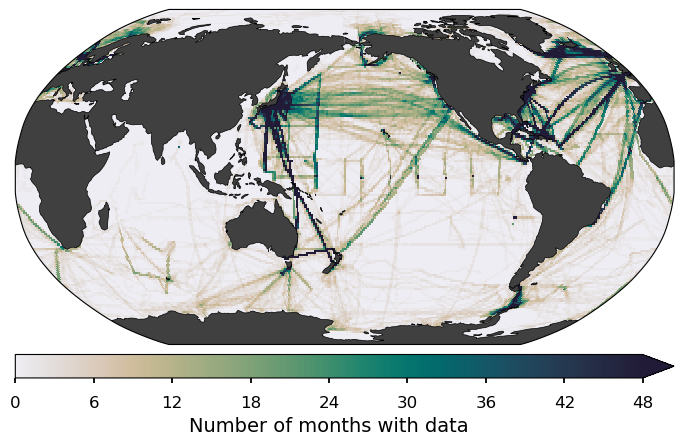

In [5]:
zarr_dir = 'gs://leap-persistent/abbysh/zarr_files_'
socat_path = f"{zarr_dir}/socat_mask_feb1982-dec2023.zarr"
# socat_mask_data = xr.open_mfdataset(socat_path, engine='zarr').sel(time=slice(str(dates[0]),str(dates[-1])))

socat_mask_data = xr.open_zarr(socat_path).sel(time=slice(str(dates[0]),str(dates[-1])))

non_zero_counts = (socat_mask_data.socat_mask != 0).sum(dim="time")
plot_style = "seaborn-v0_8-talk"

with plt.style.context(plot_style):
    fig = plt.figure(figsize=(8.5, 11)) # fig = plt.figure(dpi=300)
    worldmap = SpatialMap2(fig=fig, region='world', 
                   cbar_mode='each',
                   colorbar=True,
                   cbar_location='bottom',
                   nrows_ncols=[1,1])
    
    vrange = [0, 48, 6]
    cmap = cm.cm.rain
    data = xr_add_cyclic_point(non_zero_counts, cyclic_coord='xlon')
    data = data.assign_coords(xlon=(((data.xlon + 180) % 360) ))
    sub = worldmap.add_plot(lon=data['xlon'], lat=data['ylat'], data=data, 
                      vrange=vrange[0:2], cmap=cmap, ax=0, linewidth_coast=0.5)
    
    col = worldmap.add_colorbar(sub, ax=0,extend='max')
    worldmap.set_cbar_xlabel(col, 'Number of months with data', fontsize=14)
    worldmap.set_ticks(col, vrange[0], vrange[1], vrange[2])
    col.ax.tick_params(labelsize=12)
    plt.show()

SOCAT data coverage is uneven, with some regions, particularly in the Southern Hemisphere and open ocean areas, having significantly fewer observations. Regions with denser observational coverage, such as the Northern Hemisphere, tend to have lower biases in CO2 flux reconstructions compared to sparsely sampled areas like the Southern Ocean.

# 2. Data Introduction and Storage

## **2.1 Input (Features) Sources**
The **input features** for the machine learning model are derived from **pre-processed Earth System Model (ESM) outputs or inputs**

### **Feature and Target Variables for the ML Model**
The features used for training the **pCO₂-Residual machine learning model** are listed below:


| **Feature** | **Description** | **ESM Input or Output?** | 
|------------|----------------|----------------|
| **SST (Sea Surface Temperature)** | Simulated ocean surface temperature | **ESM Output** |  
| **SST_anom** | SST anomaly from climatology | **ESM Output** |  
| **SSS (Sea Surface Salinity)** | Simulated surface ocean salinity | **ESM Output** |  
| **SSS_anom** | SSS anomaly from climatology | **ESM Output** |  
| **MLD_clim_log** | Log-transformed climatological mixed layer depth | **ESM Output** |  
| **Chl-a (Chlorophyll concentration)** | Proxy for biological activity (log-transformed) | **ESM Output** |  
| **Chl-a_anom** | Anomaly of Chl-a | **ESM Output** |  
| **xCO₂ (Atmospheric CO₂ concentration)** | Atmospheric CO₂ mole fraction | **ESM Input, from data** |  
| **A, B, C** | Space on the globe | **See Bennington et al. 2022, Table 1** |  
| **T0, T1** | Time | **See Bennington et al. 2022, Table 1** |  


The **target variable** for reconstruction is:
- **pCO₂-Residual**: This deviation from the temperature-driven component of pCO₂, reducing SST's dominance in ML reconstructions and improving model performance in data-sparse regions (detailed below).

### **Data Sources and Paths**
The data is stored in a **cloud environment, LEAP-Pangeo**, ensuring efficient access and scalability for the machine learning workflow. Key datasets include:

- **Ensemble dir**:

  Contains the original data from pre-processed Earth System Model (ESM) outputs, available for 100+ ESM members. For computational efficiency, we rely on a selection of this dataset compiled by TA Xinyi Ke. The full ensemble data is available and could be explored, with due consideration of storage constraints. 
  
- **ML Input and Target Data**:

    Provides a dataframe-format dataset containing preprocessed ML inputs and ground truth from a selected subset of ensemble members. You may also generate your own dataset for a custom selection or range of members (see reference: Project3_Data.ipynb). Due to limited GCS storage, we recommend using the provided dataset for most projects.
  
- **SOCAT Data (Mask File)**:  

  Masking file based on real-world **SOCAT pCO₂ observations**. Here, these data are not used directly, but are input solely so that their sampling pattern in space and time can be applied to model pCO2 fields, thus mimicing real-world observational density.

### **Key Considerations:**
- **pCO₂-Residual**: By removing the temperature-driven component from pCO₂, we enhance the ability of machine learning models to capture **non-temperature-driven variability**, particularly in poorly observed regions.
- **Data Subsampling Based on SOCAT**: The use of a **SOCAT-derived mask** ensures that the ML model is trained and evaluated using a realistic observational distribution, mitigating potential biases from uneven data coverage.

### **Final Input Structure**:
- **Feature Matrix**: `(N, 12)`, where `N` represents the number of samples, and 12 predictor variables are used.
- **Target Variable**: `pCO₂-Residual`, which the model aims to reconstruct.


In [6]:
# features for ML:
features_sel = ['sst','sst_anom','sss','sss_anom','mld_clim_log','chl_log','chl_log_anom','xco2','A', 'B', 'C', 'T0', 'T1']
features_sel_noChl = ['sst','sst_anom','sss','sss_anom','mld_clim_log','xco2','A', 'B', 'C', 'T0', 'T1']
# the target variable we reconstruct:
target_sel = ['pco2_residual'] # this represents pCO2 - pCO2-T (calculated in notebook 00)

 **Compute the temperature-driven component** of pCO₂:

$$
\text{pCO}_{2,T} = \overline{\text{pCO}_2} \cdot \exp\left[ 0.0423 \cdot (T - \overline{T}) \right]
$$

- $ \overline{\text{pCO}_2} $: long-term mean of surface ocean pCO₂  
- $ T $: sea surface temperature at a given time/location  
- $ \overline{T} $: long-term mean sea surface temperature  
- $ 0.0423 $: empirically derived constant (from Takahashi et al., 1993)


 **Subtract to get the residual**:

$$
\text{pCO}_{2,\text{Residual}} = \text{pCO}_2 - \text{pCO}_{2,T}
$$

This residual is then used as the **target variable** in ML training, helping disentangle the direct solubility-driven temperature effect from other biogeochemical processes.

In our workflow, this calculation was done during processing of the Earth System Model (ESM) dataset, not included in this notebook. The datasets under `ensemble_dir` include the variable `pCO2_T`. For this notebook, we will directly use the preprocessed ML input dataset, which includes `pco2_residual`.

Later in the notebook, we recover the total pCO2 by **adding the temperature component back** to the residual:

$$
\text{pCO}_2 = \text{pCO}_{2,\text{Residual}} + \text{pCO}_{2,T}
$$


In [7]:
### set up for getting files from leap bucket ###
fs = gcsfs.GCSFileSystem()

### paths for loading: ###
# directory of regridded members from notebook 00
ensemble_dir = "gs://leap-persistent/abbysh/pco2_all_members_1982-2023/00_regridded_members" # path to regridded data
path_seeds = "gs://leap-persistent/abbysh/pickles/random_seeds.npy" # random seeds for ML

# directory of reference zarr files
zarr_dir = 'gs://leap-persistent/abbysh/zarr_files_'

# socat data file
socat_path = f"{zarr_dir}/socat_mask_feb1982-dec2023.zarr"

# preprocessed ESM ensemble members
MLinputs_path = "gs://leap-persistent/Mukkke/pco2_residual/post01_xgb_inputs"



### **Output Data Storage and Model Saving**

The output data generated by this notebook, including model predictions, performance metrics, and trained models, is saved in a cloud-based environment using a user-specific directory structure. This ensures that each user’s results are organized and accessible without interfering with others’ work.

The output data is organized into three main categories:  
1. **Machine Learning Models:** Trained models are saved for future use, ensuring that results can be replicated without re-training.  
2. **Reconstructions:** Predicted pCO₂ fields are stored for further analysis and visualization.  
3. **Performance Metrics:** CSV files containing test and unseen data performance metrics are saved for easy evaluation.


### Users must enter their Github/LEAP-Pangeo username in the cell below

In [8]:
grid_search_approach = 'nmse'
output_dir = f'gs://leap-persistent/{your_username}/{owner_username}/pco2_residual/{grid_search_approach}/post02_xgb' # where to save machine learning results

model_output_dir = f"{output_dir}/trained" # where to save ML models
recon_output_dir = f"{output_dir}/reconstructions" # where to save ML reconstructions

metrics_output_dir = f'{output_dir}/metrics' # where to save performance metrics
test_perform_fname = f"{metrics_output_dir}/xgb_test_performance_{init_date}-{fin_date}.csv" # path for test performance metrics
unseen_perform_fname = f"{metrics_output_dir}/xgb_unseen_performance_{init_date}-{fin_date}.csv" # path for unseen performance metrics

xgb_model_save_dir = f'{output_dir}/saved_models_{init_date}-{fin_date}' # where to save .json model file
xgb_model_local_save_dir = "output/model_saved"


# 3.  Earth System Models and their Ensemble Members
This notebook utilizes data from multiple Earth System Models (ESMs) that are part of the **Large Ensemble Testbed (LET)**. The LET originally includes **100 ensemble members** from different ESM, each representing unique initial conditions. These ensemble members are crucial for capturing internal climate variability and assessing model uncertainty.  

However, to optimize computational efficiency and simplify machine learning workflows, we select some representative member from the three ESM. If desired, you can modify the `mems_dict` variable to include more members from each ESM. This flexibility allows for expanded analyses while maintaining the structure of this notebook.


In [9]:
mems_dict = dict()

# Get all paths
all_paths = fs.ls(MLinputs_path)

for ens_path in all_paths:             
    ens = ens_path.split('/')[-1]
    mems = fs.ls(ens_path)
    for mem in mems:        
        memo = mem.split('/')[-1]
        if ens not in mems_dict:
            mems_dict[ens] = [memo]
        elif ens in mems_dict:
            mems_dict[ens].append(memo)


In [10]:
mems_dict

{'ACCESS-ESM1-5': ['member_r10i1p1f1',
  'member_r1i1p1f1',
  'member_r2i1p1f1',
  'member_r31i1p1f1',
  'member_r5i1p1f1'],
 'CanESM5': ['member_r1i1p1f1',
  'member_r1i1p2f1',
  'member_r2i1p1f1',
  'member_r3i1p2f1',
  'member_r6i1p2f1'],
 'MPI-ESM1-2-LR': ['member_r11i1p1f1',
  'member_r12i1p1f1',
  'member_r15i1p1f1',
  'member_r22i1p1f1',
  'member_r23i1p1f1'],
 'UKESM1-0-LL': ['member_r1i1p1f2',
  'member_r2i1p1f2',
  'member_r3i1p1f2',
  'member_r4i1p1f2',
  'member_r8i1p1f2']}


**Note:**  
The `ensemble_dir` contains a large collection of ESM outputs. We’ve already preprocessed data for **four ESMs**, each with **five members**, and saved them in the `MLinputs_path` directory for convenience.

In the starter notebook, we select only **3 ESMs** and **3 members per model** (see next cell) to reduce storage and computation. If you'd like to explore additional models or members, we recommend starting with the remaining preprocessed data available under `MLinputs_path`.

If you wish to go further and access additional members or ESMs from `ensemble_dir`, please refer to `Project3_Data.ipynb` for instructions on how to retrieve and preprocess the raw data into ML-ready DataFrames.

---
> **Storage:** Each student has a 25GB storage limit in your home directory. Please avoid stay within the quota. Each preprocessed DataFrame (covering data from 2004-01-01 to 2023-12-31) is approximately **2.35 GB**. Intermediate files are also needed.

> **/leap-persistent:** Instead of relying on home directories, we use the shared /leap-persistent/ bucket, which is a larger shared resource with common access permissions. Though there is not a quoata, please be a good citizen and avoid keeping lots of files you do not need. See the notebook "files_leappersistent_management.ipynb" with code needed to manage your files. 

> **Sharing from /leap-persistent:**  Groups can share files seamlessly with the /leap-persistent/ bucket. Consider this approach for your group. 

---

In [11]:
## Here you can change which models and how many members you use
random.seed(42)  # Set seed for reproducibility

selected_ensembles = ['ACCESS-ESM1-5', 'CanESM5', 'MPI-ESM1-2-LR']

selected_members_dict = {esm: mems_dict[esm] for esm in selected_ensembles}

selected_mems_dict = {}
num_members = 5  # Set the number of ensemble members from each ESM"

for ens, members in selected_members_dict.items():
    if len(members) >= num_members:
        selected_mems_dict[ens] = random.sample(members, num_members)  # Select `num_members` random members
    else:
        selected_mems_dict[ens] = members  # If there are fewer members than `num_members`, select all

print(selected_mems_dict)

{'ACCESS-ESM1-5': ['member_r10i1p1f1', 'member_r5i1p1f1', 'member_r2i1p1f1', 'member_r1i1p1f1', 'member_r31i1p1f1'], 'CanESM5': ['member_r1i1p2f1', 'member_r6i1p2f1', 'member_r2i1p1f1', 'member_r1i1p1f1', 'member_r3i1p2f1'], 'MPI-ESM1-2-LR': ['member_r23i1p1f1', 'member_r22i1p1f1', 'member_r11i1p1f1', 'member_r15i1p1f1', 'member_r12i1p1f1']}


To better understand how the data is organized in GCS, we can use the following command to list all files under a specific path. In this example, we check the dataset for the ESM 'ACCESS-ESM1-5' and its first member (index 0):

In [12]:
fs = gcsfs.GCSFileSystem()
ens0 = 'ACCESS-ESM1-5'
member_dir = f"{ensemble_dir}/{ens0}/{selected_mems_dict[ens0][0]}"
files = fs.ls(member_dir)

print("Files in GCS directory:")
for file in files:
    print(file)


Files in GCS directory:
leap-persistent/abbysh/pco2_all_members_1982-2023/00_regridded_members/ACCESS-ESM1-5/member_r10i1p1f1/ACCESS-ESM1-5.r10i1p1f1.Omon.zarr
leap-persistent/abbysh/pco2_all_members_1982-2023/00_regridded_members/ACCESS-ESM1-5/member_r10i1p1f1/chlclim_ACCESS-ESM1-5.r10i1p1f1.Omon.zarr


Similarly, to loop through all selected ESMs and their members, we can use the following code. This allows us to check the directory and filename for each ensemble-member combination:

In [13]:
for ens, mem_list in selected_mems_dict.items():
    for member in mem_list:
        print(ens, member)
        data_dir = f"{MLinputs_path}/{ens}/{member}"
        files = fs.ls(data_dir)
        for file in files:
            print(file)

ACCESS-ESM1-5 member_r10i1p1f1
leap-persistent/Mukkke/pco2_residual/post01_xgb_inputs/ACCESS-ESM1-5/member_r10i1p1f1/MLinput_ACCESS-ESM1-5_r10i1p1f1_mon_1x1_200401_202312.parquet
leap-persistent/Mukkke/pco2_residual/post01_xgb_inputs/ACCESS-ESM1-5/member_r10i1p1f1/MLinput_ACCESS-ESM1-5_r10i1p1f1_mon_1x1_200401_202312.pkl
ACCESS-ESM1-5 member_r5i1p1f1
leap-persistent/Mukkke/pco2_residual/post01_xgb_inputs/ACCESS-ESM1-5/member_r5i1p1f1/MLinput_ACCESS-ESM1-5_r5i1p1f1_mon_1x1_200401_202312.parquet
leap-persistent/Mukkke/pco2_residual/post01_xgb_inputs/ACCESS-ESM1-5/member_r5i1p1f1/MLinput_ACCESS-ESM1-5_r5i1p1f1_mon_1x1_200401_202312.pkl
ACCESS-ESM1-5 member_r2i1p1f1
leap-persistent/Mukkke/pco2_residual/post01_xgb_inputs/ACCESS-ESM1-5/member_r2i1p1f1/MLinput_ACCESS-ESM1-5_r2i1p1f1_mon_1x1_200401_202312.parquet
leap-persistent/Mukkke/pco2_residual/post01_xgb_inputs/ACCESS-ESM1-5/member_r2i1p1f1/MLinput_ACCESS-ESM1-5_r2i1p1f1_mon_1x1_200401_202312.pkl
ACCESS-ESM1-5 member_r1i1p1f1
leap-persis

Unlike the sparse observational data, Earth System Model (ESM) outputs provide continuous global coverage of climate variables. To better understand the observational constraints, we apply a SOCAT-based mask to the ESM data. This mask mimics the data sparsity of real-world observations by selectively masking regions where SOCAT observations are absent. The SOCAT mask varies over time, reflecting the temporal evolution of observational coverage.

Using this mask, we process all ESM data to generate a sparse dataset that requires reconstruction, where the unmasked regions serve as the ground truth for evaluating reconstruction accuracy.

In this figure, we visualize the pCO₂ field from a selected ensemble member of an ESM for a specific time period, applying the SOCAT mask to illustrate how the data coverage changes.

In [14]:
first_ens = list(selected_mems_dict.keys())[0]
first_mem = selected_mems_dict[first_ens][0]

member_dir = f"{ensemble_dir}/{first_ens}/{first_mem}"
member_path = fs.glob(f"{member_dir}/*.zarr")[0]
# member_data = xr.open_mfdataset('gs://'+member_path, engine='zarr').sel(time=slice(str(dates[0]),str(dates[-1])))
member_data = xr.open_zarr('gs://'+member_path).sel(time=slice(str(dates[0]),str(dates[-1])))

We can adjust the values of chosen_time and mmeber to explore different available data, which helps us better understand the masked ESM data that will be used in the following machine learning work.

# 4. ML Reconstruction

## 4.1 Data Split

We split data to training data set and testing dataset based on date.

In [15]:
### train-validate-test split proportions ###

select_dates = []
test_dates = []

for i in range(0,len(dates)):
    if i % 5 != 0:
        select_dates.append(dates[i]) ### 80% train days set ###
    if i % 5 == 0:
        test_dates.append(dates[i]) ### 20% test days set ### 

### Then, the month numbers above are converted back to their respective datetime objects.

year_mon = []

for i in range(0,len(select_dates)):
    
    tmp = select_dates[i]
    year_mon.append(f"{tmp.year}-{tmp.month}")
    
test_year_mon = []

for i in range(0,len(test_dates)):
    
    tmp = test_dates[i]
    test_year_mon.append(f"{tmp.year}-{tmp.month}")

## 4.2 Hyperparameters

In [16]:
params = {
    'n_estimators': 500,  # Number of boosting rounds
    'max_depth': 6,  # Maximum depth of each tree to control model complexity
    'learning_rate': 0.05,  # Step size shrinkage to prevent overfitting
    'subsample': 0.8,  # Fraction of samples used for training each tree
    'colsample_bytree': 0.8,  # Fraction of features used per tree
    'gamma': 0.1,  # Minimum loss reduction required for further partitioning
    'min_child_weight': 5,  # Minimum sum of instance weight in a leaf node
    'reg_alpha': 0.1,  # L1 regularization to reduce model complexity
    'reg_lambda': 1.0,  # L2 regularization for preventing overfitting
    'objective': 'reg:squarederror',  # Loss function for regression tasks
    'n_jobs': 30,  # Number of parallel threads to use for training
    'eval_metric': 'rmse',
    'early_stopping_rounds': 50  # Stop training if performance doesn't improve for 50 rounds
}

### Important Note: Run ML (4.3) and Reconstruction (4.4) Part Only Once

The **ML Reconstruction** step needs to be run **only once** for each ML model developed. This helps save computational resources and execution time.

The reconstruction data is saved under our **own username-specific workspace** in GCS. This means that even if you exit and re-enter JupyterHub, your data will remain available, eliminating the need for reprocessing.

### Before Running Again:
Before re-running the ML training steps, make sure a new experiment is actually necessary. Avoiding redundant computations helps optimize time and resource usage. It's also a good idea to monitor your storage regularly and clean up unnecessary files. If you're certain that no new experiment is needed, you can comment out the relevant code (set runthiscell = "0") to prevent accidental re-execution.

For reviewer, set runthiscell to -1.

## 4.3 ML training
The ML model was pre-trained and included as part of this code in the sungjoon0710 LEAP-Persistent Bucket. The models are identical to those provided by the starter code, but simply expanded in scope to 5 members each for models ACCESS-ESM1.5, CanESM5, MPI-ESM 1-2-LR.

## 4.4 Reconstruction

### What Are We Reconstructing?

After training the model, we generate pCO₂ predictions not just for evaluation but also for reconstructing spatial fields across different sample categories:

1. **`unseen_sel`**: These are grid points that are valid (no missing values, within physical bounds) but **not observed** in the SOCAT dataset (i.e., `socat_mask == 0`). Predictions on these samples (`y_pred_unseen`) test the model’s ability to generalize beyond observed regions.

2. **`sel`**: These are SOCAT-like samples where `socat_mask == 1`. They include both training and test data (depending on the year/month). Predictions here (`y_pred_seen`) are used to assess performance where observations exist.


### Explanation of Reconstruction Output Variables

Each column added to the DataFrame (`df`) serves a specific purpose in evaluation and reconstruction:

| Variable | Description |
|----------|-------------|
| `pCO2_truth` | The actual pCO₂ residual values|
| `pCO2_recon_full` | The full reconstruction result (predicted values across both SOCAT and unseen regions). |
| `pCO2_recon_unseen` | Predicted values only for unseen regions (where `socat_mask == 0`). |


If you have not changed your ML, the reconstruction step (~1 minute/member) does not need to be re-run

### 4.4.1 Add pCO2-Temperature back to reconstructed pCO2-Residual, thus recovering pCO2 

In [17]:
fs = gcsfs.GCSFileSystem(token='cloud')
zarr_path = 'leap-persistent/sungjoon0710/sungjoon0710/pco2_residual/nmse/post02_xgb/reconstructions/MPI-ESM1-2-LR'

fs.ls(zarr_path)

['leap-persistent/sungjoon0710/sungjoon0710/pco2_residual/nmse/post02_xgb/reconstructions/MPI-ESM1-2-LR/member_r11i1p1f1',
 'leap-persistent/sungjoon0710/sungjoon0710/pco2_residual/nmse/post02_xgb/reconstructions/MPI-ESM1-2-LR/member_r12i1p1f1',
 'leap-persistent/sungjoon0710/sungjoon0710/pco2_residual/nmse/post02_xgb/reconstructions/MPI-ESM1-2-LR/member_r15i1p1f1',
 'leap-persistent/sungjoon0710/sungjoon0710/pco2_residual/nmse/post02_xgb/reconstructions/MPI-ESM1-2-LR/member_r22i1p1f1',
 'leap-persistent/sungjoon0710/sungjoon0710/pco2_residual/nmse/post02_xgb/reconstructions/MPI-ESM1-2-LR/member_r23i1p1f1']

In [18]:
runthiscell = -1  # 0 will turn off, 1 will turn on

if runthiscell:
    if runthiscell == -1:
        supporting_functions.calc_recon_pco2(ensemble_dir, recon_output_dir, selected_mems_dict, init_date, fin_date, owner_username)
    else:
        supporting_functions.calc_recon_pco2(ensemble_dir, recon_output_dir, selected_mems_dict, init_date, fin_date)



Reviewing process: Running ML only for the first member of the first ESM, loading remaining reconstructed data from the notebook owner.
Current ESM: ACCESS-ESM1-5
On member member_r10i1p1f1
pco2T path: gs://leap-persistent/abbysh/pco2_all_members_1982-2023/00_regridded_members/ACCESS-ESM1-5/member_r10i1p1f1/ACCESS-ESM1-5.r10i1p1f1.Omon.zarr
pCO2R path: gs://leap-persistent/sungjoon0710/sungjoon0710/pco2_residual/nmse/post02_xgb/reconstructions/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2residual_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr
save path: gs://leap-persistent/sungjoon0710/sungjoon0710/pco2_residual/nmse/post02_xgb/reconstructions/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_member_r10i1p1f1_mon_1x1_200401_202312.zarr
finished with member_r10i1p1f1
Copying remaining members from owner’s directory...
On member member_r10i1p1f1
Copying gs://leap-persistent/sungjoon0710/sungjoon0710/pco2_residual/nmse/post02_xgb/reconstructions/ACCESS-ESM1-5/member_r5i1p1f1

**For the owner who completed the experiment and reconstructed the data:**

1. Ensure that the reconstruction data you saved under the specified path is clean, accurate, and ready for sharing.
2. Only the data you wish to save and provide to reviewers should be kept.
3. Change the permissions to allow others to read the data, ensuring it's accessible to reviewers.




# 5. Evaluation of the reconstruction against the original model output

## 5.1 Create a combined dataset with reconstruction and original 

We concatenate the outputs and ground truth from all members and ESMs into a single dataset, and then use this combined dataset to calculate bias, RMSE, and correlation.

In [19]:
datasets = []
filtered_ensembles = ['ACCESS-ESM1-5', 'CanESM5','MPI-ESM1-2-LR']
run_selected_mems_dict = {ens: mems for ens, mems in selected_mems_dict.items() if ens in filtered_ensembles}

for ensemble, members in run_selected_mems_dict.items():
    mems_dict = {ensemble: members}  
    ds = concat_datasets(mems_dict, recon_output_dir = recon_output_dir, init_date = init_date, fin_date=fin_date)
    datasets.append(ds)
concated_dataset = xr.concat(datasets, dim="ens")
evaluator = XarrayEvaluator(concated_dataset)

ds_eval = evaluator.compute_all_metrics()
print(ds_eval)

<xarray.Dataset> Size: 5GB
Dimensions:      (member: 13, ylat: 180, xlon: 360, time: 240, ens: 3)
Coordinates:
  * member       (member) object 104B 'member_r10i1p1f1' ... 'member_r6i1p2f1'
  * ylat         (ylat) float64 1kB -89.5 -88.5 -87.5 -86.5 ... 87.5 88.5 89.5
  * xlon         (xlon) float64 3kB -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
  * time         (time) datetime64[ns] 2kB 2004-01-01 2004-02-01 ... 2023-12-01
  * ens          (ens) object 24B 'ACCESS-ESM1-5' 'CanESM5' 'MPI-ESM1-2-LR'
Data variables:
    bias         (ens, member, time, ylat, xlon) float64 5GB dask.array<chunksize=(1, 1, 100, 45, 90), meta=np.ndarray>
    rmse         (ens, member, ylat, xlon) float64 20MB dask.array<chunksize=(1, 1, 45, 90), meta=np.ndarray>
    correlation  (ens, member, ylat, xlon) float64 20MB dask.array<chunksize=(1, 1, 45, 90), meta=np.ndarray>


## 5.3 Bias Visualizations
Based on this, we could visualize bias between reconstruction and model truth, averaged over the 100 ensemble members, each with a 
monthly resolution over the period init_date through fin_date. Red and blue shading indicates regions where the reconstruction is biased high or low, respectively. 

### 5.3.1 How well does the reconstruction capture the mean pCO2 field? 

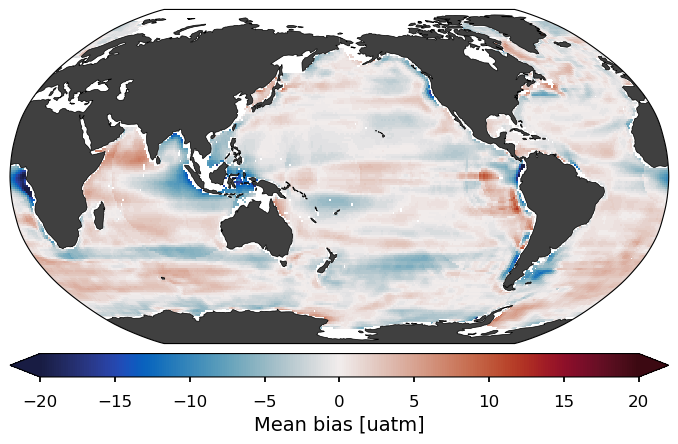

In [20]:
plot_style = "seaborn-v0_8-talk"

with plt.style.context(plot_style):
    fig = plt.figure(figsize=(8.5, 11)) # fig = plt.figure(dpi=300)
    worldmap = SpatialMap2(fig=fig, region='world', 
                           cbar_mode='single',  
                           colorbar=True,  
                           cbar_location='bottom',
                           nrows_ncols=[1,1])
    vrange = [-20, 20, 5] 
    cmap = cm.cm.balance
    
    data = (ds_eval['bias'] * 1).mean('ens').mean('member').mean('time')
    data = data.roll(xlon=len(data.xlon) // 2, roll_coords=True)
    
    data = xr_add_cyclic_point(data, cyclic_coord='xlon') 
    sub = worldmap.add_plot(lon=data['xlon'], lat=data['ylat'], data=data, 
                            vrange=vrange[0:2], cmap=cm.cm.balance, ax=0, linewidth_coast=0.5)
    
    col = worldmap.add_colorbar(sub, ax=0, extend='both')
    worldmap.set_cbar_xlabel(col, 'Mean bias [uatm]', fontsize=14)
    worldmap.set_ticks(col, vrange[0], vrange[1], vrange[2])
    col.ax.tick_params(labelsize=12)
    plt.show()


### 5.3.2 Does ESM impact the estimate of the bias? 

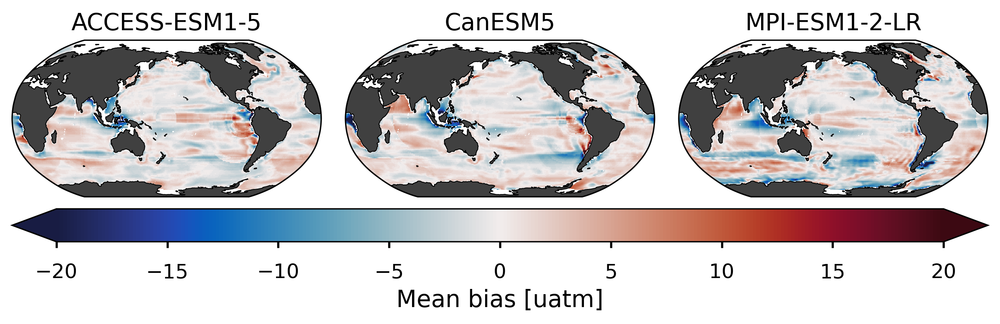

In [21]:
plot_style = "seaborn-v0_8-talk"
ensemble_means = ds_eval['bias'].mean(dim=['member', 'time'])

ensemble_names = list(ds_eval['ens'].values) 

vrange = [-20,20, 5]
cmap = cm.cm.balance

num_ensemble = len(ensemble_names)  
num_cols = 3  
num_rows = (num_ensemble + num_cols - 1) // num_cols 
with plt.style.context(plot_style):
    fig = plt.figure(dpi=300)
    worldmap = SpatialMap2(fig=fig, region='world', 
                           cbar_mode='single',  
                           colorbar=True,  
                           cbar_location='bottom',
                           nrows_ncols=[num_rows, num_cols]) 
    for i in range(num_ensemble):
        data = ensemble_means.isel(ens=i)
        data = data.roll(xlon=len(data.xlon) // 2, roll_coords=True)  
        data = xr_add_cyclic_point(data, cyclic_coord='xlon') 
        sub = worldmap.add_plot(lon=data['xlon'], lat=data['ylat'], data=data, 
                                vrange=vrange[0:2], cmap=cmap, ax=i, linewidth_coast=0.5)
        worldmap.set_title(title=ensemble_names[i], ax=i, fontsize=14)

    col = worldmap.add_colorbar(sub, ax=0, extend='both')
    worldmap.set_cbar_xlabel(col, 'Mean bias [uatm]', fontsize=14)

    worldmap.set_ticks(col, tmin=vrange[0], tmax=vrange[1], dt=vrange[2])

    col.ax.tick_params(labelsize=12)

    plt.show()


###  5.3.3 Bias visualized at seasons (DJF - Boreal Winter, MAM, JJA, SON) for the overall ensemble

Before computing spatial correlation metrics, we decompose both the reconstructed and reference pCO₂ fields into their long-term trend, seasonal cycle, and residual components using STL-like decomposition. We then evaluate their agreement by calculating gridwise correlation and standard deviation for each component across all ensemble members and ESMs.



--- Plotting Season: DJF ---


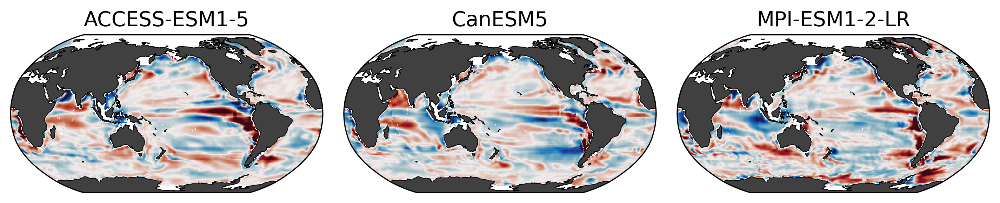


--- Plotting Season: MAM ---


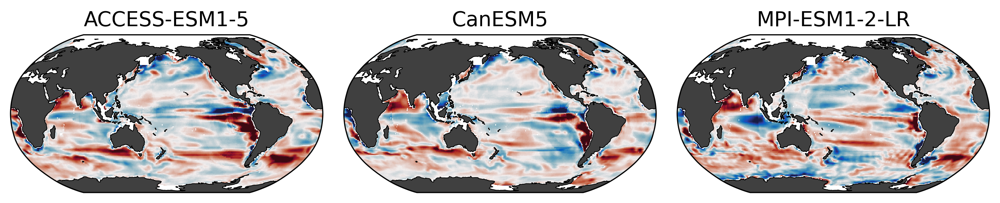


--- Plotting Season: JJA ---


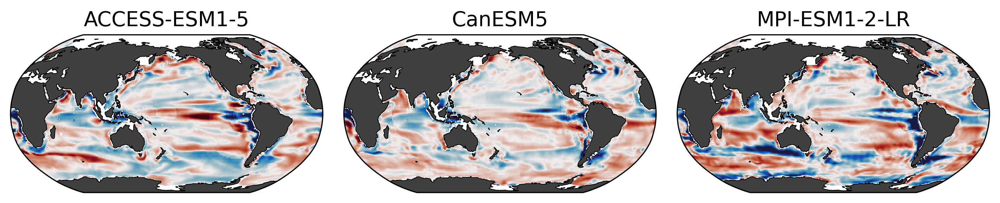


--- Plotting Season: SON ---


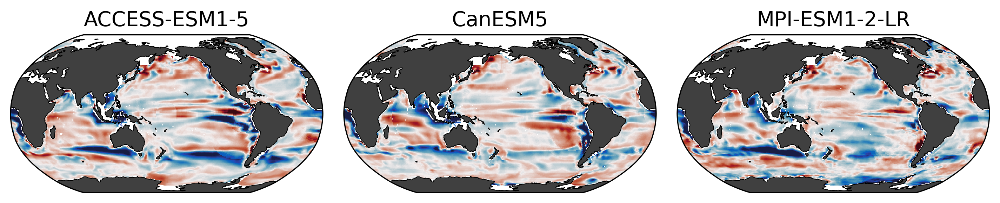

In [22]:
vrange = [-20, 20, 5]   # Updated range and interval

seasons = {
    'DJF': [12, 1, 2],
    'MAM': [3, 4, 5],
    'JJA': [6, 7, 8],
    'SON': [9, 10, 11]
}


for season_name, months in seasons.items():
    print(f"\n--- Plotting Season: {season_name} ---")

    seasonal_data = ds_eval.sel(time=ds_eval['time.month'].isin(months))
    ensemble_means = seasonal_data['bias'].mean(dim=['member', 'time'])

    with plt.style.context(plot_style):
        fig = plt.figure(figsize=(12, 6), dpi=300)
        worldmap = SpatialMap2(fig=fig, region='world', 
                               cbar_mode='single',
                               colorbar=False,
                               cbar_location='bottom',
                               nrows_ncols=[num_rows, num_cols]) 
        
        for i in range(num_ensemble):
            data = ensemble_means.isel(ens=i)
            data = data.roll(xlon=len(data.xlon) // 2, roll_coords=True)  
            data = xr_add_cyclic_point(data, cyclic_coord='xlon') 
            
            sub = worldmap.add_plot(lon=data['xlon'], lat=data['ylat'], data=data, 
                                    vrange=vrange[0:2], cmap=cmap, ax=i, linewidth_coast=0.5)
            worldmap.set_title(title=f"{ensemble_names[i]}", ax=i, fontsize=14)

        plt.show()

In [23]:
# The calculation of these statistics takes about 1 min/member
ds_eval_corr = eval_spatial(run_selected_mems_dict, recon_output_dir, init_date, fin_date)

Starting computation for ESM: ACCESS-ESM1-5, Member: member_r10i1p1f1
Starting computation for ESM: ACCESS-ESM1-5, Member: member_r5i1p1f1
Starting computation for ESM: ACCESS-ESM1-5, Member: member_r2i1p1f1
Starting computation for ESM: ACCESS-ESM1-5, Member: member_r1i1p1f1
Starting computation for ESM: ACCESS-ESM1-5, Member: member_r31i1p1f1
Starting computation for ESM: CanESM5, Member: member_r1i1p2f1
Starting computation for ESM: CanESM5, Member: member_r6i1p2f1
Starting computation for ESM: CanESM5, Member: member_r2i1p1f1
Starting computation for ESM: CanESM5, Member: member_r1i1p1f1
Starting computation for ESM: CanESM5, Member: member_r3i1p2f1
Starting computation for ESM: MPI-ESM1-2-LR, Member: member_r23i1p1f1
Starting computation for ESM: MPI-ESM1-2-LR, Member: member_r22i1p1f1
Starting computation for ESM: MPI-ESM1-2-LR, Member: member_r11i1p1f1
Starting computation for ESM: MPI-ESM1-2-LR, Member: member_r15i1p1f1
Starting computation for ESM: MPI-ESM1-2-LR, Member: membe

Phasing of reconstruction variability on seasonal, sub-decadal, and decadal, compared to original model. Correlation between 
reconstruction and original model on (a) seasonal, (b) sub-decadal, and (c) decadal time scales. 

Here, the average correlations across all ensemble members are shown. 

## 5.4 Spatial and Seasonal Structure of Model Bias
To go beyond global or time-averaged bias evaluations, we assess how reconstruction bias is distributed across space and how that distribution varies by season and ESM. By computing grid-level biases and grouping them by season and ensemble, we gain insight into how physical features (e.g., upwelling zones, seasonal DIC cycles) interact with reconstruction performance. This analysis captures both model-specific error patterns and important seasonal shifts in bias structure.

### 5.4.1 Histograms of Grid-Mean Bias by Season and Model
For each season (DJF, MAM, JJA, SON), we aggregate grid-mean bias over coarse (50°x50°) spatial bins across all model ensemble members. These distributions are visualized as overlaid histograms and KDE curves by ESM. This provides a summary of both the central tendency (mean bias), spread (uncertainty), and skewness (systematic asymmetry) in bias for each model across seasons.

In [24]:
from itertools import product
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from matplotlib.patches import Patch
def extract_binned_bias(ds_bias, lat_bins=5, lon_bins=5):
    """
    Take an xarray bias field and return coarse-gridded (mean over bins) version.
    """
    # Compute bin sizes
    lat_bin_size = lat_bins
    lon_bin_size = lon_bins
    
    # Coarsen (averaging over bins)
    coarse_bias = ds_bias.coarsen(
        ylat=lat_bin_size,
        xlon=lon_bin_size,
        boundary='trim'
    ).mean()
    
    return coarse_bias

def seasonal_bias_histograms_clean(ds_eval, season_dict, lat_bins=50, lon_bins=50):
    """
    Compute and plot seasonal bias histograms with cleaner design and working legend.
    Uses coarse-gridded maps (coarsen by lat/lon degrees).
    """

    bias = ds_eval['bias']
    esm_names = list(ds_eval['ens'].values)
    member_names = list(ds_eval['member'].values)

    for season_name, months in season_dict.items():
        print(f"\n Season: {season_name}")

        seasonal_bias = bias.sel(time=bias['time.month'].isin(months))
        mean_bias_season = seasonal_bias.mean('time')

        all_bias_records = []
        combos = list(product(esm_names, member_names))

        for esm, mem in tqdm(combos, desc=f"{season_name} - Grid binning", leave=False):
            data = mean_bias_season.sel(ens=esm, member=mem)

            coarse = extract_binned_bias(data, lat_bins=lat_bins, lon_bins=lon_bins)
            binned_bias = coarse.stack(grid=('ylat', 'xlon')).dropna('grid').values

            for val in binned_bias:
                all_bias_records.append({
                    'bias': val,
                    'ens': esm,
                    'member': mem,
                    'season': season_name
                })

        # Convert to DataFrame
        df = pd.DataFrame(all_bias_records)

        # Use consistent color mapping
        unique_ens = df['ens'].unique()
        colors = sns.color_palette("Set2", n_colors=len(unique_ens))
        color_map = dict(zip(unique_ens, colors))

        # Plot
        plt.figure(figsize=(10, 5))
        for esm in unique_ens:
            subset = df[df['ens'] == esm]
            sns.histplot(
                data=subset, x='bias', kde=True, bins=30, stat='count',
                color=color_map[esm], label=esm, alpha=0.4, linewidth=1.2
            )

        # Reference line at 0
        plt.axvline(0, color='black', linestyle='--', linewidth=1)
        plt.title(f"Bias Distribution per Grid (Season: {season_name})")
        plt.xlabel("Grid-mean Bias [µatm]")
        plt.ylabel("Number of Grid Cells")
        plt.tight_layout()

        # Manual legend using color map
        handles = [Patch(color=color_map[esm], label=esm) for esm in unique_ens]
        plt.legend(handles=handles, title="ESM", frameon=False)

        plt.show()



 Season: DJF


DJF - Grid binning:   0%|          | 0/39 [00:00<?, ?it/s]

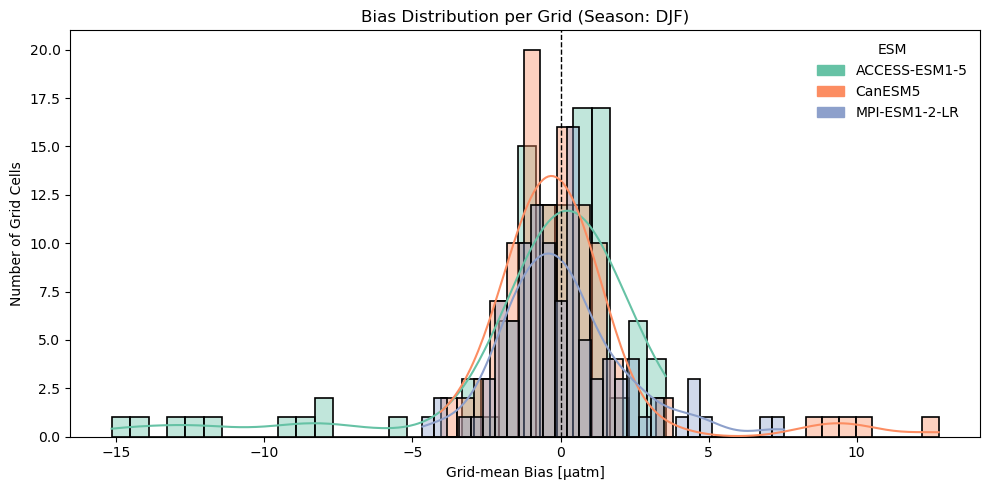


 Season: MAM


MAM - Grid binning:   0%|          | 0/39 [00:00<?, ?it/s]

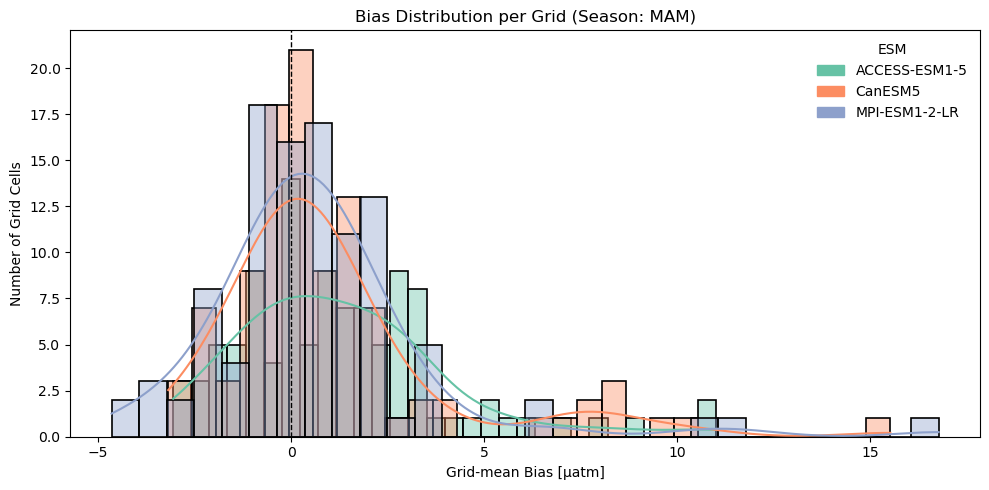


 Season: JJA


JJA - Grid binning:   0%|          | 0/39 [00:00<?, ?it/s]

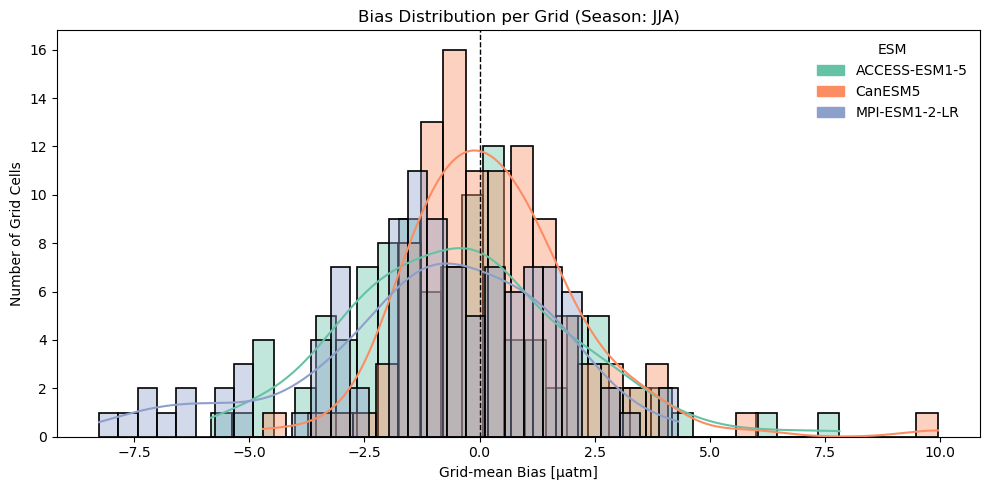


 Season: SON


SON - Grid binning:   0%|          | 0/39 [00:00<?, ?it/s]

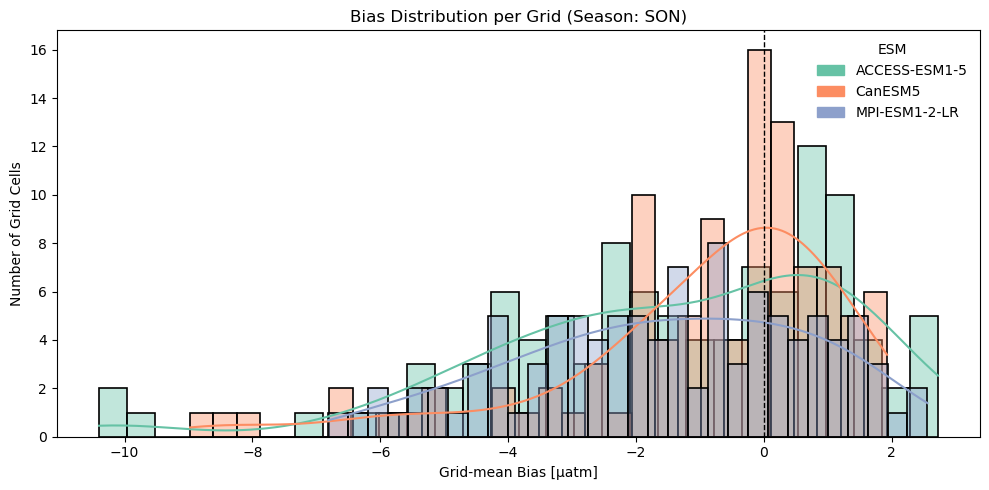

In [25]:
seasons = {
    'DJF': [12, 1, 2],
    'MAM': [3, 4, 5],
    'JJA': [6, 7, 8],
    'SON': [9, 10, 11]
}
seasonal_bias_histograms_clean(ds_eval, season_dict=seasons, lat_bins=50, lon_bins=50)

Interpretation of the above:

- DJF (Boreal Winter / Austral Summer): All ESMs show relatively symmetric and narrow bias distributions, suggesting stable reconstruction during this low-upwelling season. Minor positive biases in CanESM5 may reflect mild overestimation of CO₂ uptake.

- MAM: All models shift to the right - toward positive bias — indicating a slight overestimation of pCO₂, especially in CanESM5. This could reflect biological activity starting earlier in the models than in the true seasonal cycle.

- JJA (Austral Winter): We observe a leftward (negative) shift for ACCESS and especially MPI-ESM1-2-LR, likely tied to strong seasonal upwelling (e.g., in BUS or Humboldt), where the models and ML reconstructions tend to underestimate pCO₂ due to over-cooled SST or overshooting vertical mixing. CanESM5 remains centered near 0, suggesting it may better capture CO₂ variability in this period.

- SON (Austral Spring): This season reveals the largest skew and spread. ACCESS and MPI again show strong negative biases, while CanESM5 begins to skew left too. The increasing spread indicates growing uncertainty and mismatch between modeled upwelling dynamics and real-world carbon flux behavior.

Overall, these histograms expose how seasonality affects reconstruction performance and show that some models (notably MPI and ACCESS) exhibit stronger seasonal drift in bias structure than others.
### 5.4.2 Summary Statistics of Bias Distributions

Loading summary table from bias_summary_by_esm_and_season.csv


bias_mean  bias_std  bias_skew
ens           season                                
ACCESS-ESM1-5 DJF         -0.78      3.56      -2.32
              JJA         -0.44      2.37       0.39
              MAM          1.26      2.66       1.10
              SON         -1.43      2.73      -0.89
CanESM5       DJF          0.14      2.57       2.52
              JJA          0.32      1.86       0.84
              MAM          1.04      2.96       1.80
              SON         -0.95      2.22      -1.46
MPI-ESM1-2-LR DJF          0.10      2.04       0.79
              JJA         -1.04      2.55      -0.75
              MAM          0.65      2.79       1.66
              SON         -1.54      2.22      -0.32

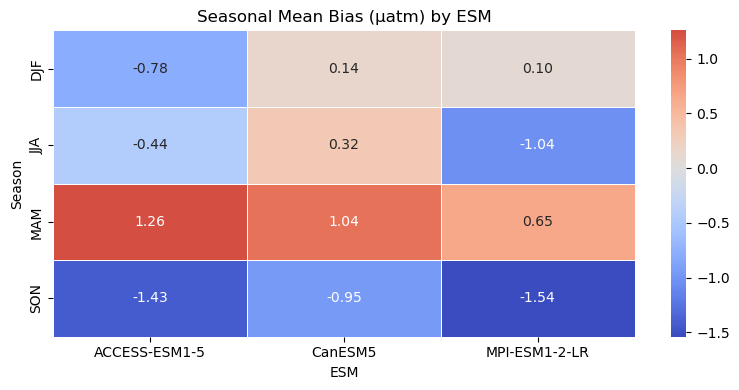

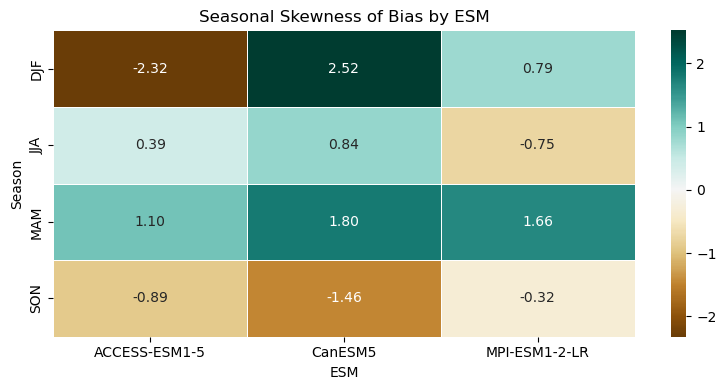

In [26]:
import os

seasons = {
    'DJF': [12, 1, 2],
    'MAM': [3, 4, 5],
    'JJA': [6, 7, 8],
    'SON': [9, 10, 11]
}

csv_path = "bias_summary_by_esm_and_season.csv"

if os.path.exists(csv_path):
    print(f"Loading summary table from {csv_path}")
    summary_table = pd.read_csv(csv_path, index_col=[0, 1])
    display(summary_table)
    summary_table_sorted = summary_table.reset_index().pivot(index="season", columns="ens")

    plt.figure(figsize=(8, 4))
    sns.heatmap(summary_table_sorted["bias_mean"], annot=True, cmap="coolwarm", center=0, fmt=".2f", linewidths=0.5)
    plt.title("Seasonal Mean Bias (µatm) by ESM")
    plt.ylabel("Season")
    plt.xlabel("ESM")
    plt.tight_layout()
    plt.show()
    
    plt.figure(figsize=(8, 4))
    sns.heatmap(summary_table_sorted["bias_skew"], annot=True, cmap="BrBG", center=0, fmt=".2f", linewidths=0.5)
    plt.title("Seasonal Skewness of Bias by ESM")
    plt.ylabel("Season")
    plt.xlabel("ESM")
    plt.tight_layout()
    plt.show()

else:
    # print(f"Computing seasonal bias summary...")
    # bias_summary_df = seasonal_bias_stats(ds_eval, season_dict=seasons, lat_bins=50, lon_bins=50)
    # summary_table = bias_summary_df.groupby(["ens", "season"])[["bias_mean", "bias_std", "bias_skew"]].mean().round(2)
    # summary_table.to_csv(csv_path)
    # print(f"Saved to {csv_path}")
    # summary_table_sorted = summary_table.reset_index().pivot(index="season", columns="ens")
    # plt.figure(figsize=(8, 4))
    # sns.heatmap(summary_table_sorted["bias_mean"], annot=True, cmap="coolwarm", center=0, fmt=".2f", linewidths=0.5)
    # plt.title("Seasonal Mean Bias (µatm) by ESM")
    # plt.ylabel("Season")
    # plt.xlabel("ESM")
    # plt.tight_layout()
    # plt.show()
    
    # # Plot: Skewness Heatmap
    # plt.figure(figsize=(8, 4))
    # sns.heatmap(summary_table_sorted["bias_skew"], annot=True, cmap="BrBG", center=0, fmt=".2f", linewidths=0.5)
    # plt.title("Seasonal Skewness of Bias by ESM")
    # plt.ylabel("Season")
    # plt.xlabel("ESM")
    # plt.tight_layout()
    # plt.show()

    print("Summary table is not saved in the folder, and it takes a long time to run and generate. Uncomment the lines above if you want to generate the summary table. However, here is the summary table we ran and generated before with interpretations:")

## 5.4.3 Final Takeaway Regarding Seasonality
The seasonal histograms and bias summary statistics reveal how strongly each ESM's reconstruction bias is shaped not just by model formulation, but also by season. Three dominant patterns emerge:

- ACCESS-ESM1-5 displays the most pronounced seasonal asymmetry. Its bias is strongly negative and left-skewed in DJF (–2.32 skew), shifts to positive and right-skewed in MAM, and reverts to negative again in SON. These shifts suggest that ACCESS may misrepresent seasonal transitions like upwelling onset and SST cooling, especially in under-observed regions such as the Southern Ocean and BUS.

- CanESM5 appears the most stable in terms of bias magnitude, remaining close to zero across all seasons. However, its high skewness in DJF (2.52) and strong left skew in SON (–1.46) imply that it may harbor asymmetric regional errors — possibly due to sharp, underrepresented gradients along land–ocean boundaries or in upwelling zones.

- MPI-ESM1-2-LR shows the most volatile seasonal bias pattern. It transitions from near-zero mean bias in DJF to strongly negative values in JJA and SON, with moderate skew changes. This instability likely reflects a mismatch between MPI’s internal seasonal dynamics (e.g., upwelling intensity, mixed-layer depth) and the real-world processes the ML model attempts to reconstruct from.

Among the three ESMs, MPI-ESM1-2-LR exhibits the greatest seasonal instability and bias drift, making it a less suitable testbed for evaluating reconstructions sensitive to seasonal upwelling and DIC cycling. While ACCESS shows moderate seasonal degradation, CanESM5 emerges as the most seasonally consistent, though still warranting caution in under-observed coastal zones.

# 6.1 Visualization of Ensemble Performance - RMSE, Bias, Correlation

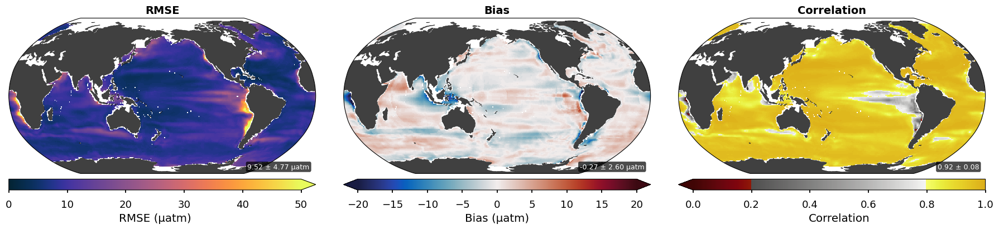


RMSE Summary Stats:
Mean   : 9.52 µatm
Median : 8.47 µatm
Stdev  : 4.77 µatm
Min    : 3.60 µatm
Max    : 103.27 µatm

Bias Summary Stats:
Mean   : -0.27 µatm
Median : -0.03 µatm
Stdev  : 2.60 µatm
Min    : -29.61 µatm
Max    : 12.30 µatm

Correlation Summary Stats:
Mean   : 0.92 
Median : 0.94 
Stdev  : 0.08 
Min    : -0.01 
Max    : 1.00 


In [27]:
plot_style = "seaborn-v0_8-talk"

with plt.style.context(plot_style):
    # Setup Figure for side-by-side plots
    fig = plt.figure(figsize=(18, 5))   # Wide figure for 3 plots
    worldmap = SpatialMap2(fig=fig, region='world',
                   cbar_mode='each',
                   axes_pad=0.5,
                   colorbar=True,
                   cbar_location='bottom',
                   nrows_ncols=[1,3])   # 1 row, 3 columns

    # ====== RMSE ======
    vrange_rmse = [0, 50, 10]
    cmap_rmse = cm.cm.thermal
    data_rmse = ds_eval['rmse'].mean('ens').mean('member')
    data_rmse = data_rmse.roll(xlon=len(data_rmse.xlon) // 2, roll_coords=True)
    data_rmse = xr_add_cyclic_point(data_rmse, cyclic_coord='xlon')
    sub_rmse = worldmap.add_plot(lon=data_rmse['xlon'], lat=data_rmse['ylat'], data=data_rmse, 
                                 vrange=vrange_rmse[0:2], cmap=cmap_rmse, ax=0)
    col_rmse = worldmap.add_colorbar(sub_rmse, ax=0, extend='max')
    worldmap.set_cbar_xlabel(col_rmse, f'RMSE (µatm)')
    worldmap.set_ticks(col_rmse, vrange_rmse[0], vrange_rmse[1], vrange_rmse[2])

    # Overlay text for RMSE
    rmse_values = data_rmse.values.flatten()
    rmse_values = rmse_values[~np.isnan(rmse_values)]
    worldmap.grid[0].text(
        0.98, 0.02,
        f"{rmse_values.mean():.2f} ± {rmse_values.std():.2f} µatm",
        fontsize=9, color='white',
        ha='right', va='bottom',
        transform=worldmap.grid[0].transAxes,
        bbox=dict(facecolor='black', alpha=0.7, boxstyle='round,pad=0.2')
    )

    # ====== Bias ======
    vrange_bias = [-20, 20, 5]
    cmap_bias = cm.cm.balance
    data_bias = ds_eval['bias'].mean('ens').mean('member').mean('time')
    data_bias = data_bias.roll(xlon=len(data_bias.xlon) // 2, roll_coords=True)
    data_bias = xr_add_cyclic_point(data_bias, cyclic_coord='xlon')
    sub_bias = worldmap.add_plot(lon=data_bias['xlon'], lat=data_bias['ylat'], data=data_bias, 
                                 vrange=vrange_bias[0:2], cmap=cmap_bias, ax=1)
    col_bias = worldmap.add_colorbar(sub_bias, ax=1, extend='both')
    worldmap.set_cbar_xlabel(col_bias, f'Bias (µatm)')
    worldmap.set_ticks(col_bias, vrange_bias[0], vrange_bias[1], vrange_bias[2])

    # Overlay text for Bias
    bias_values = data_bias.values.flatten()
    bias_values = bias_values[~np.isnan(bias_values)]
    worldmap.grid[1].text(
        0.98, 0.02,
        f"{bias_values.mean():.2f} ± {bias_values.std():.2f} µatm",
        fontsize=9, color='white',
        ha='right', va='bottom',
        transform=worldmap.grid[1].transAxes,
        bbox=dict(facecolor='black', alpha=0.7, boxstyle='round,pad=0.2')
    )

    # ====== Correlation ======
    vrange_corr = [0, 1, 0.2]
    cmap_corr = cm.cm.oxy
    data_corr = ds_eval['correlation'].mean('ens').mean('member')
    data_corr = data_corr.roll(xlon=len(data_corr.xlon) // 2, roll_coords=True)
    data_corr = xr_add_cyclic_point(data_corr, cyclic_coord='xlon')
    sub_corr = worldmap.add_plot(lon=data_corr['xlon'], lat=data_corr['ylat'], data=data_corr, 
                                 vrange=vrange_corr[0:2], cmap=cmap_corr, ax=2)
    col_corr = worldmap.add_colorbar(sub_corr, ax=2, extend='min')
    worldmap.set_cbar_xlabel(col_corr, f'Correlation')
    worldmap.set_ticks(col_corr, vrange_corr[0], vrange_corr[1], vrange_corr[2])

    # Overlay text for Correlation
    corr_values = data_corr.values.flatten()
    corr_values = corr_values[~np.isnan(corr_values)]
    worldmap.grid[2].text(
        0.98, 0.02,
        f"{corr_values.mean():.2f} ± {corr_values.std():.2f}",
        fontsize=9, color='white',
        ha='right', va='bottom',
        transform=worldmap.grid[2].transAxes,
        bbox=dict(facecolor='black', alpha=0.7, boxstyle='round,pad=0.2')
    )

    # ===== Titles =====
    worldmap.grid[0].set_title("RMSE", fontsize=14, fontweight='bold')
    worldmap.grid[1].set_title("Bias", fontsize=14, fontweight='bold')
    worldmap.grid[2].set_title("Correlation", fontsize=14, fontweight='bold')

    plt.tight_layout()
    plt.show()

    # ===== Summary Statistics Function =====
    def print_stats(name, values, unit='µatm'):
        print(f"\n{name} Summary Stats:")
        print(f"Mean   : {values.mean():.2f} {unit}")
        print(f"Median : {np.median(values):.2f} {unit}")
        print(f"Stdev  : {values.std():.2f} {unit}")
        print(f"Min    : {values.min():.2f} {unit}")
        print(f"Max    : {values.max():.2f} {unit}")

    # ===== Print Stats =====
    print_stats("RMSE", rmse_values)
    print_stats("Bias", bias_values)
    print_stats("Correlation", corr_values, unit='')  # Correlation is unitless


## 6.2 Visualization of Member Performance - RMSE

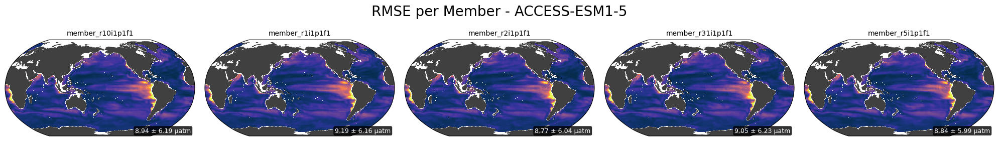

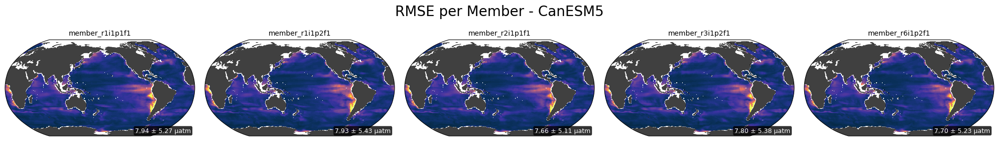

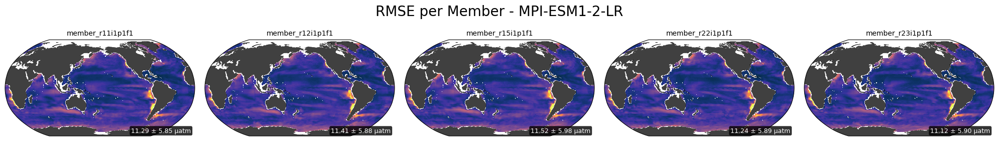

In [28]:
import warnings
warnings.filterwarnings("ignore", message=".*tight_layout.*")


plot_style = "seaborn-v0_8-talk"

# Define colorbar range for RMSE
vrange_rmse = [0, 50, 10]   # Adjust as needed
cmap_rmse = cm.cm.thermal

with plt.style.context(plot_style):
    for ens in ds_eval['ens'].values:
        members = ds_eval.sel(ens=ens)['member'].values
        
        # Filter members with valid RMSE data
        valid_members = []
        for member in members:
            rmse_values = ds_eval['rmse'].sel(ens=ens, member=member).values.flatten()
            if not np.isnan(rmse_values).all():
                valid_members.append(member)
        
        n_members_valid = len(valid_members)
        
        if n_members_valid == 0:
            #print(f"Skipping {ens} — No members with valid RMSE data.\n")
            continue
        
        # Setup figure based on valid members
        fig = plt.figure(figsize=(4 * n_members_valid, 3.0))
        worldmap = SpatialMap2(fig=fig, region='world',
                               axes_pad=0.2,
                               colorbar=False,
                               nrows_ncols=[1, n_members_valid])
        
        for idx, member in enumerate(valid_members):
            # Select RMSE for this member
            data = ds_eval['rmse'].sel(ens=ens, member=member)
            data = data.roll(xlon=len(data.xlon) // 2, roll_coords=True)
            data = xr_add_cyclic_point(data, cyclic_coord='xlon')
            
            sub = worldmap.add_plot(lon=data['xlon'], lat=data['ylat'], data=data, 
                                    vrange=vrange_rmse[0:2], cmap=cmap_rmse, ax=idx)
            
            worldmap.grid[idx].set_title(f"{member}", fontsize=10)
            
            # Summary Stats
            rmse_values = data.values.flatten()
            rmse_values = rmse_values[~np.isnan(rmse_values)]
            
            mean_rmse = rmse_values.mean()
            std_rmse = rmse_values.std()
            
            # Print stats
            #print(f"Summary statistics of RMSE data for {ens} | {member} \n")
            #print(f"Mean RMSE  : {mean_rmse:.2f} µatm")
            #print(f"Stdev RMSE : {std_rmse:.2f} µatm")
            #print(f"Median RMSE: {np.median(rmse_values):.2f} µatm")
            #print(f"Min RMSE   : {rmse_values.min():.2f} µatm")
            #print(f"Max RMSE   : {rmse_values.max():.2f} µatm\n")
            
            # ---- Add overlay text ----
            worldmap.grid[idx].text(
                0.98, 0.02,
                f"{mean_rmse:.2f} ± {std_rmse:.2f} µatm",
                fontsize=9,
                color='white',
                ha='right',
                va='bottom',
                transform=worldmap.grid[idx].transAxes,
                bbox=dict(facecolor='black', alpha=0.8, boxstyle='round,pad=0.2')
            )
        
        plt.suptitle(f'RMSE per Member - {ens}', fontsize=20)
        plt.tight_layout()
        plt.show()

Notice that each indiviual member has its own areas of strength and weakness. For instance, the ACCESS and CanESM models give more stable performance for the Southern Ocean (near Antarctica) and the North Pacific Ocean. MPI, conversely, gives much lower errors in the ENSO region. 

## 6.3 Visualization of Member Performance - Bias

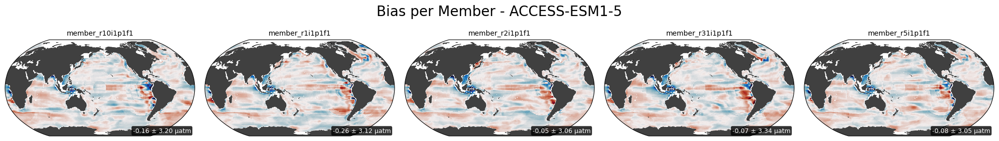

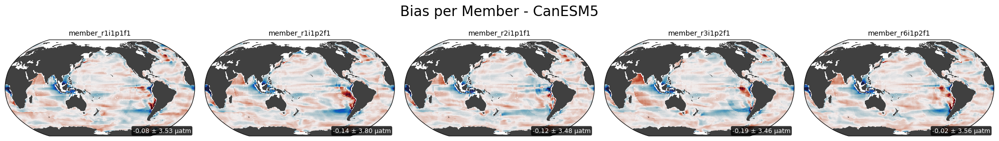

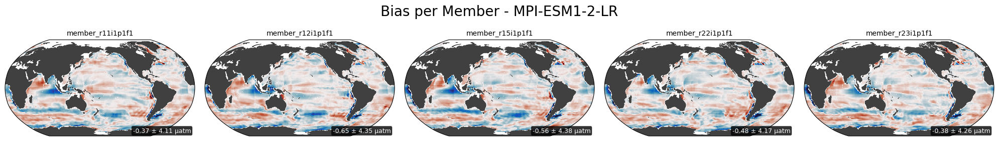

In [29]:
plot_style = "seaborn-v0_8-talk"
warnings.filterwarnings("ignore", message=".*tight_layout.*")

# Define colorbar range for Bias
vrange_bias = [-20, 20, 5]    # Adjust based on your bias distribution
cmap_bias = cm.cm.balance     # Diverging colormap for positive/negative bias

with plt.style.context(plot_style):
    for ens in ds_eval['ens'].values:
        members = ds_eval.sel(ens=ens)['member'].values
        
        # Filter members with valid Bias data
        valid_members = []
        for member in members:
            bias_values = ds_eval['bias'].sel(ens=ens, member=member).mean('time').values.flatten()
            if not np.isnan(bias_values).all():
                valid_members.append(member)
        
        n_members_valid = len(valid_members)
        
        if n_members_valid == 0:
            continue  # Skip if no valid members
        
        # Setup figure
        fig = plt.figure(figsize=(4 * n_members_valid, 3))
        worldmap = SpatialMap2(fig=fig, region='world',
                               axes_pad=0.2,
                               colorbar=False,
                               nrows_ncols=[1, n_members_valid])
        
        for idx, member in enumerate(valid_members):
            # Select Bias for this member (mean over time)
            data = ds_eval['bias'].sel(ens=ens, member=member).mean('time')
            data = data.roll(xlon=len(data.xlon) // 2, roll_coords=True)
            data = xr_add_cyclic_point(data, cyclic_coord='xlon')
            
            sub = worldmap.add_plot(lon=data['xlon'], lat=data['ylat'], data=data, 
                                    vrange=vrange_bias[0:2], cmap=cmap_bias, ax=idx)
            
            worldmap.grid[idx].set_title(f"{member}", fontsize=10)
            
            # Summary Stats
            bias_vals = data.values.flatten()
            bias_vals = bias_vals[~np.isnan(bias_vals)]
            
            mean_bias = bias_vals.mean()
            std_bias = bias_vals.std()
            
            # ---- Add overlay text ----
            worldmap.grid[idx].text(
                0.98, 0.02,
                f"{mean_bias:.2f} ± {std_bias:.2f} µatm",
                fontsize=9,
                color='white',
                ha='right',
                va='bottom',
                transform=worldmap.grid[idx].transAxes,
                bbox=dict(facecolor='black', alpha=0.8, boxstyle='round,pad=0.2')
            )        
        plt.suptitle(f'Bias per Member - {ens}', fontsize=20)
        plt.tight_layout()
        plt.show()


The bias map gives us hints as to whether the members are overestimating or underestimating the near-surface pCO2 - which will come in handy later on in the analysis section. 

## 6.4 Visualization of Member Performance - Correlation

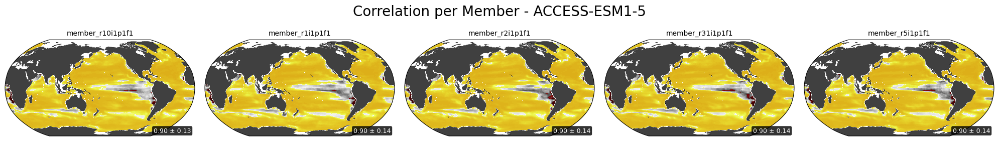

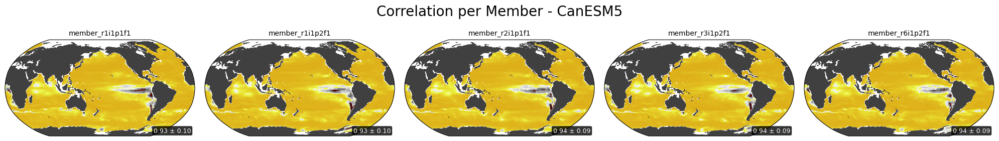

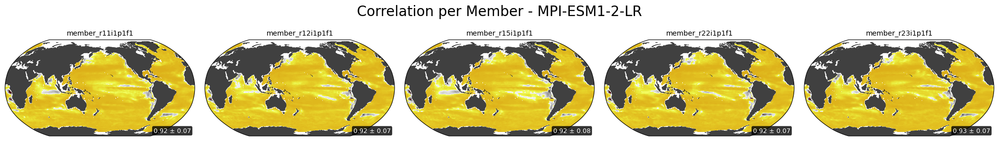

In [30]:
plot_style = "seaborn-v0_8-talk"
# Define colorbar range for Correlation
vrange_corr = [0, 1, 0.2]
cmap_corr = cm.cm.oxy   # Suitable for correlation strength

with plt.style.context(plot_style):
    for ens in ds_eval['ens'].values:
        members = ds_eval.sel(ens=ens)['member'].values
        
        # Filter members with valid Correlation data
        valid_members = []
        for member in members:
            corr_values = ds_eval['correlation'].sel(ens=ens, member=member).values.flatten()
            if not np.isnan(corr_values).all():
                valid_members.append(member)
        
        n_members_valid = len(valid_members)
        
        if n_members_valid == 0:
            continue  # Skip if no valid members
        
        # Setup figure
        fig = plt.figure(figsize=(4 * n_members_valid, 3))
        worldmap = SpatialMap2(fig=fig, region='world',
                               axes_pad=0.2,
                               colorbar=False,
                               nrows_ncols=[1, n_members_valid])
        
        for idx, member in enumerate(valid_members):
            # Select Correlation for this member
            data = ds_eval['correlation'].sel(ens=ens, member=member)
            data = data.roll(xlon=len(data.xlon) // 2, roll_coords=True)
            data = xr_add_cyclic_point(data, cyclic_coord='xlon')
            
            sub = worldmap.add_plot(lon=data['xlon'], lat=data['ylat'], data=data, 
                                    vrange=vrange_corr[0:2], cmap=cmap_corr, ax=idx)
            
            worldmap.grid[idx].set_title(f"{member}", fontsize=10)
            
            # Summary Stats
            corr_vals = data.values.flatten()
            corr_vals = corr_vals[~np.isnan(corr_vals)]
            
            mean_corr = corr_vals.mean()
            std_corr = corr_vals.std()
            
            # ---- Add overlay text ----
            worldmap.grid[idx].text(
                0.98, 0.02,
                f"{mean_corr:.2f} ± {std_corr:.2f}",
                fontsize=9,
                color='white',
                ha='right',
                va='bottom',
                transform=worldmap.grid[idx].transAxes,
                bbox=dict(facecolor='black', alpha=0.8, boxstyle='round,pad=0.2')
            )
        plt.suptitle(f'Correlation per Member - {ens}', fontsize=20)
        plt.tight_layout()
        plt.show()


Notice superior performance of MPI-ESM model in the eastern tropical pacific - the area off the western coast of Northern South America (Nino 1+2, Nino 3 regions).  This hints at the fact that the MPI-ESM model succeeds in capturing the seasonal variablilty of ENSO and its impact on the pCO2 of the region. 

# 7. Further investigations into the three main geographic sources of generalization error

## 7.1 Peru-Chile Upwelling System

## *Why is RMSE unusually high off the west coast of South America?*

We observe an unusually high RMSE (root mean square error) off the west coast of South America across all ensemble members, especially pronounced in the ACCESS-ESM members. While one might suspect this is due to the coarse grid resolution (~100 km × 100 km), which may blur coastal boundaries and mix land-ocean signals, this explanation is insufficient. Other coastlines do not exhibit similarly elevated RMSE despite facing similar resolution limitations. Therefore, we consider deeper observational and oceanographic causes:

---

### 7.1.1 Sparse Observational Coverage

- **Limited pCO₂ Measurements**  
  Much of this region has fewer than 10 months of observed pCO₂ measurements. In many grid cells, especially nearshore, observations are either extremely sparse or absent.

- **Impact on Model Evaluation**  
  Sparse data coverage limits the ability of machine learning models and Earth system models to generalize well in this region. This leads to poor estimation of pCO₂ climatology and seasonal variability, which inflates RMSE during validation.

---

### 7.1.2 Complexity of the Peru–Chile Upwelling System

This region is home to one of the most productive and dynamic oceanographic systems globally:

#### a. High pCO₂ Variability
- Upwelling of deep, cold, nutrient- and CO₂-rich waters drives rapid and extreme fluctuations in surface pCO₂.
- These fluctuations occur over fine spatial (~10s of km) and temporal (days to weeks) scales that are not captured by coarse-resolution models.

#### b. Sharp Physical and Chemical Gradients
- The region features steep gradients in:
  - Sea Surface Temperature (SST),
  - Salinity,
  - Nutrient concentrations,
  - and pCO₂.

- Machine learning models and many physical models **smooth** these gradients, leading to:
  - Underestimation of extremes,
  - Poor resolution of boundary-layer dynamics.

#### c. Biogeochemical Feedbacks
- Phytoplankton blooms, rapid CO₂ uptake, and nutrient cycling add nonlinear feedbacks that are difficult to parameterize.
- Coastal systems like this are especially challenging for models due to the interplay between physical upwelling and biological consumption.

---

### 7.1.3 ACCESS-ESM Model Specific Biases

- **Structural biases** may exist in how ACCESS-ESM models represent:
  - Upwelling dynamics,
  - Wind stress fields (which drive upwelling),
  - Coastal currents like the Peru–Chile Current,
  - Air-sea gas exchange.

- **Parameterization Issues**  
  Coastal processes often occur below the resolution of global ESMs. If parameterizations for vertical mixing, coastal boundary dynamics, or biogeochemical interactions are not tuned for eastern boundary systems, errors can become magnified in regions like the South American west coast.

---

## 7.2 Southern Coast of Africa (Benguela) Upwelling System
The Benguela Upwelling System (BUS), located along the southwest coast of Africa (approximately 10°E–20°E longitude and 35°S–10°S latitude), is one of the world’s most productive upwelling zones. It is driven by strong southeasterly winds, especially during the austral winter and spring (JJA and SON), which bring cold, nutrient- and CO₂-rich deep waters to the surface.

This process increases surface pCO₂ through two competing effects:
- Cooling enhances CO₂ solubility, leading to potential over-uptake.
- Upwelling raises DIC-rich waters, pushing pCO₂ higher.

However, many models overestimate the upwelling strength and cooling, leading to an underestimate of pCO₂ in this region — especially during strong upwelling seasons. This appears as a negative bias in reconstructions, i.e., the model + ML predicts lower-than-true pCO₂.


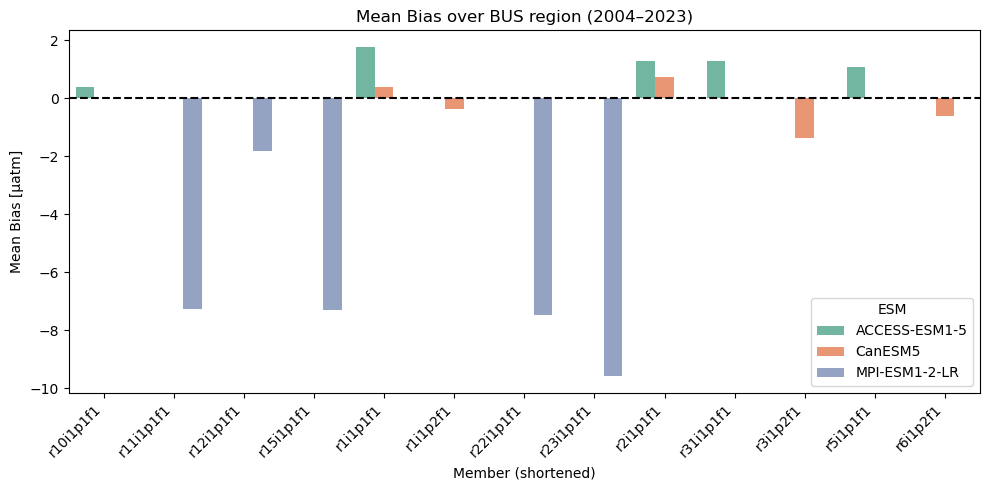

In [31]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define Benguela Upwelling System (BUS) box
lat_range = slice(-35, -10)  # 35°S to 10°S
lon_range = slice(10, 20)    # 10°E to 20°E

# Extract bias over BUS region
bus_bias = ds_eval['bias'].sel(ylat=lat_range, xlon=lon_range)

# Mean bias per model/member
bus_bias_mean = bus_bias.mean(dim=["ylat", "xlon", "time"]).to_dataframe().reset_index()

bus_bias_mean["member_clean"] = bus_bias_mean["member"].apply(lambda x: x.replace("member_", ""))

plt.figure(figsize=(10,5))
sns.barplot(data=bus_bias_mean, x="member_clean", y="bias", hue="ens", palette="Set2")

plt.title("Mean Bias over BUS region (2004–2023)")
plt.axhline(0, color='black', linestyle='--')
plt.ylabel("Mean Bias [µatm]")
plt.xlabel("Member (shortened)")

# Rotate x-axis labels
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.legend(title="ESM")
plt.show()

The bar plot above confirms this seasonal and regional bias:
- Most ensemble members from MPI-ESM1-2-LR (blue bars) show strong negative bias, indicating a pronounced cold bias in BUS.
- CanESM5 and ACCESS-ESM1-5 show more balanced or slightly positive biases, though some members still dip negative.
- The consistent negative bias across MPI members aligns with known issues in its simulation of upwelling and surface fluxes, especially during JJA and SON, as shown in earlier seasonal histograms.

The pronounced cold bias in BUS, especially from MPI-ESM1-2-LR, reflects a well-documented modeling issue - an overactive upwelling system during high-seasonal-variability periods. This reinforces the need to account for both regional data sparsity and seasonal physical realism when reconstructing surface pCO₂ in key upwelling regions.

## 7.3 ENSO Regions and Seasonality

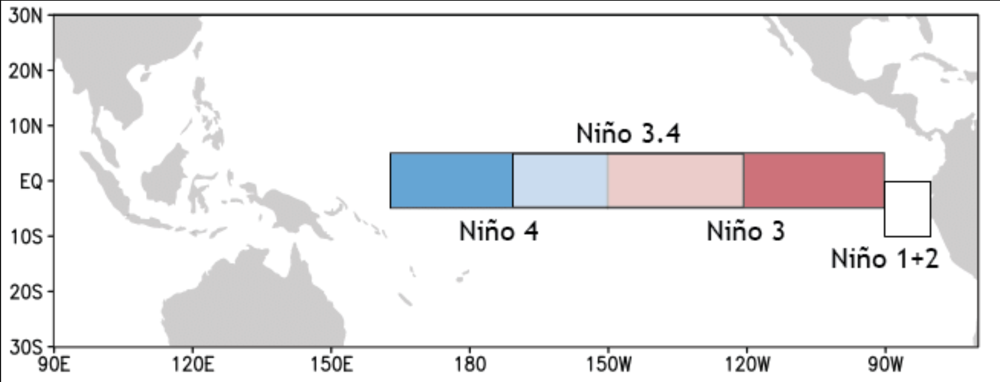

In [32]:
Image(filename="images/ninoregions.png", width=800)
#source: https://www.researchgate.net/figure/Location-of-the-Nino-regions-for-measuring-Sea-Surface-Temperature-SST-in-the-eastern_fig4_328685089

ENSO Regions are defined as below:
- Niño 1+2: Near South America (90°W–80°W)
- Niño 3: Central-eastern Pacific (150°W–90°W)
- Niño 3.4: Central Pacific (170°W–120°W) — used most often for tracking El Niño/La Niña
- Niño 4: Farther west (160°E–150°W)

### 7.3.1 ENSO times the rise and fall of SST and upwelling changes

__- Neutral State__

Trade winds (east-to-west) push surface water from east to west. 

This movement draws up cold, nutrient-rich deep water near the eastern Pacific (Peru/Ecuador/Chile) — called upwelling (as seen in section 7.1).

The upwelled water is __cold, rich in CO₂, and rich in nutrients__ 

__- Cold  Event (La Nina)__

Trade winds strengthen, upwelling intensifies.

Cold water spreads westward, CO2-rich water reaches the surface even more strongly. 

More nutrients -> chlorophyll blooms   

Upwelled water already has high pCO₂, and the ocean is venting CO₂ to the atmosphere - surface pCO2 is __higher__. 



__- Warm Event (El Nino)__

Upwelling slows, so less CO₂-rich water reaches the surface. -> Lower atmospheric CO2

Fewer nutrients → less phytoplankton → low chlorophyll.

Photosynthesis drops, but CO₂ flux to the atmosphere also drops — surface pCO₂ is actually __lower__.

### 7.3.2 How ENSO dynamics across seasons show up in our bias results
Recall the results from 5.3.3, bias visualized over seasons (DJF, MAM, JJA, SON). The models 
- __Overestimate__ surface pCO2 (RED) during weak-upwelling seasons __(DJF/MAM)__ and
- __Underestimate__ surface pCO2 (BLUE) during strong-upwelling seasons __(JJA/SON)__,

suggesting they do not fully capture the seasonal strength of upwelling in the eastern tropical Pacific.

### 7.3.3 Interpreting these results

| Season | Ocean Dynamics | Expected pCO₂ behavior | What Models Miss |
|:---|:---|:---|:---|
| **DJF/MAM** | Upwelling is **weaker**; ocean warms slightly | Surface pCO₂ should **decrease** because reduced deep water input | Models **overestimate** pCO₂ because they assume too much deep-water CO₂ is still coming up |
| **JJA/SON** | Upwelling is **stronger** (strong trade winds) | Surface pCO should **increase** sharply from vigorous upwelling | Models **underestimate** pCO₂ because they fail to fully capture the increase in surface pCO₂ from the deep water CO₂ input |

# 8. The Biotic Story: Chlorophyll Analysis 

## 8.1. Initial Motivation of Choosing Chlorophyll: 
Among all the ESM output, we picked chlorophyll to do feature importance analysis and feature engineering,(Chl-a (Chlorophyll concentration)	Proxy for biological activity (log-transformed)	ESM Output) because Chl-a can be a direct indicator of the plankton/algae in a certain area, and if a large mass of such creature do photosynthesis, a lot of CO2 will be generated to the air and sea and increase pCO2.

At the very beginning we defined the two feature lists: features_sel (all features) and features_sel_noChl
## 8.2.  Training Phase:
We trained a separate XGBoost model for each selected ESM/member using the reduced feature set (features_sel_noChl). You saved these models using joblib to the output/model_saved_noChl/ directory. Then we loaded the saved NoChl models and do residual predictions.

## 8.3. Blending model training to get the best weight for the Chl-a
We already know the importance of the Chl-a variable in pCO2 reconstruction, so we want to attribute weight to them to see if we can see better reconstruction results. We trained a simple Linear Regression model (the "blender") using the test set predictions (original and NoChl) as inputs and the test set true residual as the target, after the learning there will be a best weight from the .process. We then use that to generate a pco2_pred_residual_blended

In [33]:
import os 

grid_search_approach = 'nmse'

gcs_base = f'gs://leap-persistent/{"30815kelvin"}/{"30815kelvin"}/pco2_residuals/{grid_search_approach}'

# Original paths (adding '_orig' suffix for clarity and separation)
output_dir_orig = f'{gcs_base}/post02_xgb_orig'
xgb_model_local_save_dir_orig = f"output/model_saved_orig" # Local saving for original models
if not os.path.exists(xgb_model_local_save_dir_orig): os.makedirs(xgb_model_local_save_dir_orig, exist_ok=True) # Create local dir
recon_output_dir_orig = f"{output_dir_orig}/reconstructions" # GCS saving for original reconstructions
metrics_output_dir_orig = f'{output_dir_orig}/metrics' # GCS saving for original metrics
test_perform_fname_orig = f"{metrics_output_dir_orig}/xgb_test_performance_{init_date}-{fin_date}.csv"
unseen_perform_fname_orig = f"{metrics_output_dir_orig}/xgb_unseen_performance_{init_date}-{fin_date}.csv"

# --- Paths for NOCHL experiment ---
# Use the same base, but add '_noChl' suffix
output_dir_noChl = f'{gcs_base}/post02_xgb_noChl'
xgb_model_local_save_dir_noChl = f"output/model_saved_noChl" # Local saving for noChl models
if not os.path.exists(xgb_model_local_save_dir_noChl): os.makedirs(xgb_model_local_save_dir_noChl, exist_ok=True) # Create local dir
recon_output_dir_noChl = f"{output_dir_noChl}/reconstructions" # GCS saving for noChl reconstructions
metrics_output_dir_noChl = f'{output_dir_noChl}/metrics' # GCS saving for noChl metrics
# test_perform_fname_noChl = f"{metrics_output_dir_noChl}/xgb_test_performance_noChl_{init_date}-{fin_date}.csv" # Optional test metrics
unseen_perform_fname_noChl = f"{metrics_output_dir_noChl}/xgb_unseen_performance_noChl_{init_date}-{fin_date}.csv" # Unseen metrics

# --- Paths for BLENDING experiment --- (Define here for consistency)
blending_input_dir = f'{gcs_base}/post02_xgb_blending_inputs' # Store intermediate PKLs
recon_output_dir_blended = f'{gcs_base}/post02_xgb_blended_reconstructions' # Final blended output

# --- Keep original variable names IF NEEDED by unchanged later cells ---
# If subsequent cells rely *specifically* on 'output_dir', 'recon_output_dir' etc.
# you might need to decide which experiment they should point to by default,
# or update those cells to use the specific _orig or _noChl variables.
# For now, let's keep the original names pointing to the original experiment paths:
output_dir = output_dir_orig
# model_output_dir = f"{output_dir}/trained" # This wasn't used much later anyway
recon_output_dir = recon_output_dir_orig
metrics_output_dir = metrics_output_dir_orig
test_perform_fname = test_perform_fname_orig
unseen_perform_fname = unseen_perform_fname_orig
xgb_model_local_save_dir = xgb_model_local_save_dir_orig

print("Defined paths for Original, NoChl, and Blending experiments:")
print(f"  Original GCS Output: {output_dir_orig}")
print(f"  NoChl GCS Output:    {output_dir_noChl}")
print(f"  Blending Input GCS:  {blending_input_dir}")
print(f"  Blending GCS Output: {recon_output_dir_blended}")
print(f"  Original Local Model Save: {xgb_model_local_save_dir_orig}")
print(f"  NoChl Local Model Save:    {xgb_model_local_save_dir_noChl}")

Defined paths for Original, NoChl, and Blending experiments:
  Original GCS Output: gs://leap-persistent/30815kelvin/30815kelvin/pco2_residuals/nmse/post02_xgb_orig
  NoChl GCS Output:    gs://leap-persistent/30815kelvin/30815kelvin/pco2_residuals/nmse/post02_xgb_noChl
  Blending Input GCS:  gs://leap-persistent/30815kelvin/30815kelvin/pco2_residuals/nmse/post02_xgb_blending_inputs
  Blending GCS Output: gs://leap-persistent/30815kelvin/30815kelvin/pco2_residuals/nmse/post02_xgb_blended_reconstructions
  Original Local Model Save: output/model_saved_orig
  NoChl Local Model Save:    output/model_saved_noChl


In [34]:
# Cell 2 (Simplified): Train and Save ORIGINAL Model (RUNS 1 MEMBER PER ESM)

import joblib
import os
import numpy as np
import pandas as pd
import xgboost as xgb
from collections import defaultdict
import datetime
import gc

runthiscell_orig_train_fast_subset = 1 # Use a unique flag if desired

if runthiscell_orig_train_fast_subset:
    print("--- Starting ORIGINAL Model Training (Fast - 1 Member per ESM) ---")
    # --- Load seeds, setup seed locations ---
    try: random_seeds = np.load(fs.open(path_seeds))
    except Exception as e: print(f"ERROR loading seeds: {e}"); raise
    seed_loc_dict = defaultdict(dict); # Recreate seed locations based on full selected_mems_dict
    for ens_key,mem_list_val in selected_mems_dict.items():
        sub_dictt = dict(); [sub_dictt.update({mem_val: no}) for no, mem_val in enumerate(mem_list_val)]; seed_loc_dict.update({ens_key: sub_dictt})
    val_prop = .2; test_prop = .0

    print(f"Start time: {datetime.datetime.now()}")
    for ens, mem_list in selected_mems_dict.items(): # Iterate through original selection
        # ***** SELECT ONLY THE FIRST MEMBER FROM THE LIST *****
        if not mem_list: # Skip if an ESM somehow has no members listed
            print(f"WARNING: No members found for {ens}. Skipping ESM.")
            continue
        member = mem_list[0] # Process only the first member in the list for this ESM
        # *****************************************************

        print(f"\n--- Training Original Model: {ens} - {member} (Selected Member) ---")
        # Initialize for finally block
        model_orig=None; df=None; Xtrain=None; ytrain=None; X_val=None; y_val=None; X_train_val=None

        try:
            # Check seed_loc exists for this specific member
            if member not in seed_loc_dict.get(ens, {}):
                 print(f"  WARNING: Seed location not found for {ens}/{member}. Check dict alignment. Skipping.")
                 continue
            seed_loc = seed_loc_dict[ens][member]
            member_id = member.split('_')[-1]
            fpath = f"{MLinputs_path}/{ens}/{member}/MLinput_{ens}_{member_id}_mon_1x1_{init_date}_{fin_date}.pkl"

            # --- Load Data & Select Training Data ---
            print(f"  Loading data: {fpath}")
            with fs.open(fpath, 'rb') as f: df = pd.read_pickle(f)
            if isinstance(df.index, pd.MultiIndex): df_time_index = df.index.get_level_values('time')
            else: df_time_index = df.index
            recon_sel = (~df[features_sel+target_sel+['net_mask']].isna().any(axis=1)) & ((df[target_sel] < 250) & (df[target_sel] > -250)).to_numpy().ravel()
            sel = recon_sel & (df['socat_mask'] == 1)
            train_dates_full = [f"{ym_str}-01" for ym_str in year_mon]
            train_datetimes = pd.to_datetime(train_dates_full)
            is_train_time = df_time_index.normalize().isin(train_datetimes)
            train_sel_mask = sel & is_train_time

            # --- Prepare Data Subsets ---
            print("  Preparing data subsets...")
            df_train = df[train_sel_mask].copy(); del df; gc.collect()
            ytrain = df_train[target_sel].to_numpy().ravel()
            Xtrain = df_train[features_sel].to_numpy() # Use ORIGINAL features
            N = Xtrain.shape[0]; print(f"  N Train Samples: {N}")
            if N == 0: print("  No training samples found. Skipping."); continue

            # --- Train/Validation Split ---
            print("  Splitting training data indices...")
            train_val_idx, _, val_idx, _ = supporting_functions.train_val_test_split(N, test_prop, val_prop, random_seeds, seed_loc)
            X_train_val = Xtrain[train_val_idx]; y_train_val = ytrain[train_val_idx]
            X_val = Xtrain[val_idx]; y_val = ytrain[val_idx]
            print(f"  Train/Val shapes: {X_train_val.shape}, {X_val.shape}")
            del Xtrain, ytrain; gc.collect() # Free full training set memory

            # --- Initialize and Train the ORIGINAL Model ---
            print("  Initializing and Fitting ORIGINAL model...")
            model_orig = XGBRegressor(random_state=random_seeds[5, seed_loc], **params)
            model_orig.fit(X_train_val, y_train_val, eval_set=[(X_val, y_val)], verbose=False)
            print("  Fitting complete.")

            # --- Save the ORIGINAL Model using joblib ---
            model_fname = f"model_pCO2_2D_{ens}_{member_id}_mon_1x1_{init_date}_{fin_date}.joblib"
            lpath = os.path.join(xgb_model_local_save_dir_orig, model_fname) # Save to _orig directory
            print(f"  Saving original model to: {lpath}")
            joblib.dump(model_orig, lpath); print("  Original model saved.")

            # --- Evaluation REMOVED ---

        except FileNotFoundError as e_fnf: print(f"ERROR: Input file not found: {e_fnf}. Skipping.")
        except Exception as e: print(f"ERROR processing {ens}/{member}: {e}. Skipping.")
        finally: # Cleanup
             print("  Cleaning up training variables...")
             if 'model_orig' in locals() and model_orig is not None: del model_orig
             if 'df_train' in locals() and df_train is not None: del df_train
             if 'X_val' in locals() and X_val is not None: del X_val
             if 'y_val' in locals() and y_val is not None: del y_val
             if 'X_train_val' in locals() and X_train_val is not None: del X_train_val
             if 'y_train_val' in locals() and y_train_val is not None: del y_train_val
             gc.collect()

    print(f'--- End of Original Model Training (Fast - 1 Member per ESM) --- {datetime.datetime.now()}')
else:
    print("Original Model Training (Fast - 1 Member per ESM) skipped.")

--- Starting ORIGINAL Model Training (Fast - 1 Member per ESM) ---
Start time: 2025-04-29 18:07:00.645572

--- Training Original Model: ACCESS-ESM1-5 - member_r10i1p1f1 (Selected Member) ---
  Loading data: gs://leap-persistent/Mukkke/pco2_residual/post01_xgb_inputs/ACCESS-ESM1-5/member_r10i1p1f1/MLinput_ACCESS-ESM1-5_r10i1p1f1_mon_1x1_200401_202312.pkl
  Preparing data subsets...
  N Train Samples: 177628
  Splitting training data indices...
  Train/Val shapes: (177628, 13), (35526, 13)
  Initializing and Fitting ORIGINAL model...
  Fitting complete.
  Saving original model to: output/model_saved_orig/model_pCO2_2D_ACCESS-ESM1-5_r10i1p1f1_mon_1x1_200401_202312.joblib
  Original model saved.
  Cleaning up training variables...

--- Training Original Model: CanESM5 - member_r1i1p2f1 (Selected Member) ---
  Loading data: gs://leap-persistent/Mukkke/pco2_residual/post01_xgb_inputs/CanESM5/member_r1i1p2f1/MLinput_CanESM5_r1i1p2f1_mon_1x1_200401_202312.pkl
  Preparing data subsets...
  N Tr

In [35]:
# Cell 3 (Simplified): Train and Save NOCHL Model (RUNS 1 MEMBER PER ESM)

import joblib
import os
import numpy as np
import pandas as pd
import xgboost as xgb
from collections import defaultdict
import datetime
import gc

# --- Ensure necessary variables are defined globally ---
# features_sel (for NaN check), features_sel_noChl, target_sel, params,
# MLinputs_path, selected_mems_dict, xgb_model_local_save_dir_noChl,
# path_seeds, seed_loc_dict, val_prop, test_prop (0), year_mon,
# fs, supporting_functions

runthiscell_noChl_train_fast_subset = 1 # Use a unique flag if desired

if runthiscell_noChl_train_fast_subset:
    print("--- Starting NOCHL Model Training (Fast - 1 Member per ESM) ---")
    # --- Load seeds, setup seed locations ---
    try: random_seeds = np.load(fs.open(path_seeds))
    except Exception as e: print(f"ERROR loading seeds: {e}"); raise
    # Recreate seed_loc_dict based on the *original* selected_mems_dict structure if needed
    seed_loc_dict = defaultdict(dict);
    # This needs to map the member being processed to its original index if selected_mems_dict was subset earlier
    # Assuming seed_loc_dict was correctly created in the first setup cell based on the full list
    temp_mems_dict_for_seed = defaultdict(list)
    all_input_paths_for_seed = fs.ls(MLinputs_path)
    for ens_path_seed in all_input_paths_for_seed:
         ens_seed = ens_path_seed.split('/')[-1]
         if ens_seed in selected_mems_dict: # Check if it's an ESM we care about
              mems_in_path_seed = fs.ls(ens_path_seed)
              for mem_path_seed in mems_in_path_seed:
                  temp_mems_dict_for_seed[ens_seed].append(mem_path_seed.split('/')[-1])
    for ens_key_seed, mem_list_val_seed in temp_mems_dict_for_seed.items():
        sub_dictt_seed = dict(); [sub_dictt_seed.update({mem_val_seed: no_seed}) for no_seed, mem_val_seed in enumerate(mem_list_val_seed)]; seed_loc_dict.update({ens_key_seed: sub_dictt_seed})

    val_prop = .2; test_prop = .0
    run_selected_mems_dict = selected_mems_dict # Use the original dict containing all potential members

    print(f"Start time: {datetime.datetime.now()}")
    for ens, mem_list in run_selected_mems_dict.items(): # Iterate through original selection
        # ***** SELECT ONLY THE FIRST MEMBER FROM THE LIST *****
        if not mem_list: print(f"WARNING: No members listed for {ens}. Skipping."); continue
        member = mem_list[0] # Process only the first member
        # *****************************************************

        print(f"\n--- Training noChl Model: {ens} - {member} (Selected Member) ---")
        # Initialize for finally block
        model_noChl=None; df=None; df_train=None; Xtrain_noChl=None; ytrain=None; X_val_noChl=None; y_val=None; X_train_val_noChl=None; y_train_val=None

        try:
            # Ensure seed location is available for this specific member
            if member not in seed_loc_dict.get(ens, {}):
                 print(f"  WARNING: Seed location not found for {ens}/{member}. Check dict. Skipping.")
                 continue
            seed_loc = seed_loc_dict[ens][member]
            member_id = member.split('_')[-1]
            fpath = f"{MLinputs_path}/{ens}/{member}/MLinput_{ens}_{member_id}_mon_1x1_{init_date}_{fin_date}.pkl"

            # --- Load Data & Select Training Data ---
            print(f"  Loading data: {fpath}")
            with fs.open(fpath, 'rb') as f: df = pd.read_pickle(f)
            if isinstance(df.index, pd.MultiIndex): df_time_index = df.index.get_level_values('time')
            else: df_time_index = df.index
            recon_sel = (~df[features_sel+target_sel+['net_mask']].isna().any(axis=1)) & ((df[target_sel] < 250) & (df[target_sel] > -250)).to_numpy().ravel() # Use full feature list for NaN check
            sel = recon_sel & (df['socat_mask'] == 1)
            train_dates_full = [f"{ym_str}-01" for ym_str in year_mon]; train_datetimes = pd.to_datetime(train_dates_full)
            is_train_time = df_time_index.normalize().isin(train_datetimes)
            train_sel_mask = sel & is_train_time

            # --- Prepare Data Subsets ---
            print("  Preparing data subsets...")
            df_train = df[train_sel_mask].copy(); del df; gc.collect()
            ytrain = df_train[target_sel].to_numpy().ravel()
            Xtrain_noChl = df_train[features_sel_noChl].to_numpy() # Use NOCHL features
            N = Xtrain_noChl.shape[0]; print(f"  N Train Samples: {N}")
            if N == 0: print("  No training samples found. Skipping."); continue

            # --- Train/Validation Split ---
            print("  Splitting training data indices...")
            train_val_idx, _, val_idx, _ = supporting_functions.train_val_test_split(N, test_prop, val_prop, random_seeds, seed_loc)
            X_train_val_noChl = Xtrain_noChl[train_val_idx]; y_train_val = ytrain[train_val_idx] # Use NoChl features here
            X_val_noChl = Xtrain_noChl[val_idx]; y_val = ytrain[val_idx] # Target y is the same
            print(f"  Train/Val shapes: {X_train_val_noChl.shape}, {X_val_noChl.shape}")
            del Xtrain_noChl, ytrain; gc.collect() # Free full training set memory

            # --- Initialize and Train the NOCHL Model ---
            print("  Initializing and Fitting NOCHL model...")
            model_noChl = XGBRegressor(random_state=random_seeds[5, seed_loc], **params)
            model_noChl.fit(X_train_val_noChl, y_train_val, eval_set=[(X_val_noChl, y_val)], verbose=False)
            print("  Fitting complete.")

            # --- Save the NOCHL Model using joblib ---
            model_fname = f"model_pCO2_2D_{ens}_{member_id}_mon_1x1_{init_date}_{fin_date}_noChl.joblib"
            lpath = os.path.join(xgb_model_local_save_dir_noChl, model_fname) # Save to _noChl directory
            print(f"  Saving noChl model to: {lpath}")
            joblib.dump(model_noChl, lpath); print("  noChl model saved.")

            # --- Evaluation REMOVED ---

        except FileNotFoundError as e_fnf: print(f"ERROR: Input file not found: {e_fnf}. Skipping.")
        except Exception as e: print(f"ERROR processing {ens}/{member}: {e}. Skipping.")
        finally: # Cleanup
             print("  Cleaning up training variables...")
             if 'model_noChl' in locals() and model_noChl is not None: del model_noChl
             if 'df_train' in locals() and df_train is not None: del df_train
             if 'X_val_noChl' in locals() and X_val_noChl is not None: del X_val_noChl
             if 'y_val' in locals() and y_val is not None: del y_val
             if 'X_train_val_noChl' in locals() and X_train_val_noChl is not None: del X_train_val_noChl
             if 'y_train_val' in locals() and y_train_val is not None: del y_train_val
             gc.collect()

    print(f'--- End of noChl Model Training (Fast - 1 Member per ESM) --- {datetime.datetime.now()}')
else:
    print("noChl Model Training (Fast - 1 Member per ESM) skipped.")

--- Starting NOCHL Model Training (Fast - 1 Member per ESM) ---
Start time: 2025-04-29 18:08:20.629998

--- Training noChl Model: ACCESS-ESM1-5 - member_r10i1p1f1 (Selected Member) ---
  Loading data: gs://leap-persistent/Mukkke/pco2_residual/post01_xgb_inputs/ACCESS-ESM1-5/member_r10i1p1f1/MLinput_ACCESS-ESM1-5_r10i1p1f1_mon_1x1_200401_202312.pkl
  Preparing data subsets...
  N Train Samples: 177628
  Splitting training data indices...
  Train/Val shapes: (177628, 11), (35526, 11)
  Initializing and Fitting NOCHL model...
  Fitting complete.
  Saving noChl model to: output/model_saved_noChl/model_pCO2_2D_ACCESS-ESM1-5_r10i1p1f1_mon_1x1_200401_202312_noChl.joblib
  noChl model saved.
  Cleaning up training variables...

--- Training noChl Model: CanESM5 - member_r1i1p2f1 (Selected Member) ---
  Loading data: gs://leap-persistent/Mukkke/pco2_residual/post01_xgb_inputs/CanESM5/member_r1i1p2f1/MLinput_CanESM5_r1i1p2f1_mon_1x1_200401_202312.pkl
  Preparing data subsets...
  N Train Samples

In [36]:
# Cell 4: Reconstruct Residual with ORIGINAL model (Save Locally)

import joblib
import os
import numpy as np
import pandas as pd
import xarray as xr
import datetime
import gc # Import garbage collector

runthiscell_orig_recon_local = 1 # Use unique flag

if runthiscell_orig_recon_local:
    print("--- Starting ORIGINAL Model Residual Reconstruction (Saving Locally) ---")
    run_selected_mems_dict = selected_mems_dict # Adapt reviewer mode if needed

    # --- Define LOCAL save directory for original residuals ---
    local_recon_dir_orig = "output/recon_residuals_orig" # Relative path in instance storage

    print(f"Start time: {datetime.datetime.now()}")
    for ens, mem_list in run_selected_mems_dict.items():
        # Select only the first member if running subset
        if not mem_list: continue
        member = mem_list[0] # Process only the first member

        print(f"\n--- Reconstructing Original Residual: {ens} - {member} (Selected Member) ---")
        model_orig=None; df=None; df_recon=None; DS_recon_orig=None # Init for finally

        try:
            member_id = member.split('_')[-1]
            # --- Model Path (Local) ---
            model_filename_orig = f"model_pCO2_2D_{ens}_{member_id}_mon_1x1_{init_date}_{fin_date}.joblib"
            local_load_path_orig = os.path.join(xgb_model_local_save_dir_orig, model_filename_orig)

            # --- Data Path (GCS) ---
            data_dir = f"{MLinputs_path}/{ens}/{member}"; fname = f"MLinput_{ens}_{member_id}_mon_1x1_{init_date}_{fin_date}.pkl"; file_path = f"{data_dir}/{fname}"

            # --- Load Model ---
            print(f"  Loading original model: {local_load_path_orig}")
            if not os.path.exists(local_load_path_orig): print(f"  WARNING: Original model file not found. Skipping."); continue
            model_orig = joblib.load(local_load_path_orig); print("  Model loaded.")

            # --- Load Data & Select ---
            print(f"  Loading data: {file_path}")
            with fs.open(file_path, 'rb') as f: df = pd.read_pickle(f)
            recon_sel = (~df[features_sel+target_sel+['net_mask']].isna().any(axis=1)) & ((df[target_sel] < 250) & (df[target_sel] > -250)).to_numpy().ravel()
            df_recon = df[recon_sel].copy(); del df; gc.collect()
            if df_recon.empty: print("  ERROR: No valid data points. Skipping."); continue

            # --- Predict ---
            print("  Making original predictions...")
            X_recon_orig = df_recon[features_sel].to_numpy()
            y_pred_recon_orig = model_orig.predict(X_recon_orig)

            # --- Prepare Dataset ---
            print("  Preparing original residual dataset...")
            df_recon['pCO2_recon_full'] = y_pred_recon_orig
            df_recon['pCO2_truth'] = df_recon[target_sel]
            DS_recon_orig = df_recon[['net_mask','socat_mask','pCO2_recon_full', 'pCO2_truth']].to_xarray()

            # --- Define LOCAL Save Path ---
            save_path_orig_residual_local = f"{local_recon_dir_orig}/{ens}/{member}/recon_pCO2residual_{ens}_{member_id}_mon_1x1_{init_date}_{fin_date}.zarr"
            print(f"  Saving original residual recon LOCALLY to: {save_path_orig_residual_local}")
            os.makedirs(os.path.dirname(save_path_orig_residual_local), exist_ok=True) # Create local dirs

            # --- Save Locally ---
            try:
                DS_recon_orig.to_zarr(save_path_orig_residual_local, consolidated=True, mode='w')
                print(f"  Original residual recon LOCAL save call complete.")
                save_successful_local = os.path.exists(save_path_orig_residual_local)
                print(f"  Verification: Does LOCAL Zarr directory exist? {save_successful_local}")
            except Exception as e_save:
                print(f"  ERROR during LOCAL DS_recon_orig.to_zarr: {e_save}")

        except FileNotFoundError as e_fnf: print(f"ERROR: Input file not found: {e_fnf}. Skipping.")
        except Exception as e_other: print(f"ERROR processing {ens}/{member}: {e_other}. Skipping.")
        finally: print("  Cleaning up..."); del model_orig, df_recon, DS_recon_orig; gc.collect()

    print(f'--- End of Original Residual Reconstruction (Local Save) --- {datetime.datetime.now()}')
else: print("Original Residual Reconstruction (Local Save) skipped.")

--- Starting ORIGINAL Model Residual Reconstruction (Saving Locally) ---
Start time: 2025-04-29 18:09:39.797406

--- Reconstructing Original Residual: ACCESS-ESM1-5 - member_r10i1p1f1 (Selected Member) ---
  Loading original model: output/model_saved_orig/model_pCO2_2D_ACCESS-ESM1-5_r10i1p1f1_mon_1x1_200401_202312.joblib
  Model loaded.
  Loading data: gs://leap-persistent/Mukkke/pco2_residual/post01_xgb_inputs/ACCESS-ESM1-5/member_r10i1p1f1/MLinput_ACCESS-ESM1-5_r10i1p1f1_mon_1x1_200401_202312.pkl
  Making original predictions...
  Preparing original residual dataset...
  Saving original residual recon LOCALLY to: output/recon_residuals_orig/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2residual_ACCESS-ESM1-5_r10i1p1f1_mon_1x1_200401_202312.zarr
  Original residual recon LOCAL save call complete.
  Verification: Does LOCAL Zarr directory exist? True
  Cleaning up...

--- Reconstructing Original Residual: CanESM5 - member_r1i1p2f1 (Selected Member) ---
  Loading original model: output/model

In [37]:
# Cell 5: Reconstruct Residual with NOCHL Model (Simplified, 1 Member per ESM)

import joblib; import os; import numpy as np; import pandas as pd; import xarray as xr; import datetime; import gc


runthiscell_noChl_recon_subset = 1 # Use unique flag

if runthiscell_noChl_recon_subset:
    print("--- Starting NOCHL Model Residual Reconstruction (Simplified - 1 Member per ESM) ---")
    run_selected_mems_dict = selected_mems_dict # Use original dict

    print(f"Start time: {datetime.datetime.now()}")
    for ens, mem_list in run_selected_mems_dict.items(): # Loop through original dict
        # ***** SELECT ONLY THE FIRST MEMBER *****
        if not mem_list: continue
        member = mem_list[0]

        print(f"\n--- Reconstructing noChl Residual: {ens} - {member} (Selected Member) ---")
        model_noChl=None; df=None; df_recon=None; DS_recon_noChl=None # Init for finally

        try:
            member_id = member.split('_')[-1]
            fpath = f"{MLinputs_path}/{ens}/{member}/MLinput_{ens}_{member_id}_mon_1x1_{init_date}_{fin_date}.pkl"
            model_fname = f"model_pCO2_2D_{ens}_{member_id}_mon_1x1_{init_date}_{fin_date}_noChl.joblib"
            lpath = os.path.join(xgb_model_local_save_dir_noChl, model_fname) # Load from _noChl dir

            print(f"  Loading model: {lpath}")
            if not os.path.exists(lpath): print(f"  WARNING: noChl model file not found. Skipping."); continue
            model_noChl = joblib.load(lpath); print("  Model loaded.")

            print(f"  Loading data: {fpath}")
            with fs.open(fpath, 'rb') as f: df = pd.read_pickle(f)
            recon_sel = (~df[features_sel+target_sel+['net_mask']].isna().any(axis=1)) & ((df[target_sel] < 250) & (df[target_sel] > -250)).to_numpy().ravel()
            df_recon = df[recon_sel].copy(); del df; gc.collect()
            if df_recon.empty: print("  ERROR: No valid data points. Skipping."); continue

            print("  Making noChl predictions...")
            X_recon_noChl = df_recon[features_sel_noChl].to_numpy() # Use noChl features
            y_pred_recon_noChl = model_noChl.predict(X_recon_noChl)

            print("  Preparing noChl residual dataset...")
            df_recon['pCO2_recon_full_noChl'] = y_pred_recon_noChl
            df_recon['pCO2_truth'] = df_recon[target_sel]
            DS_recon_noChl = df_recon[['net_mask','socat_mask','pCO2_recon_full_noChl', 'pCO2_truth']].to_xarray()
            DS_recon_noChl = DS_recon_noChl.rename({'pCO2_recon_full_noChl': 'pCO2_recon_full'}) # Rename

            save_path = f"{recon_output_dir_noChl}/{ens}/{member}/recon_pCO2residual_{ens}_{member_id}_mon_1x1_{init_date}_{fin_date}_noChl.zarr" # Save to _noChl dir
            print(f"  Saving noChl residual recon to: {save_path}")
            pdir = os.path.dirname(save_path); fs.mkdirs(pdir, exist_ok=True)
            try:
                DS_recon_noChl.to_zarr(save_path, consolidated=True, mode='w'); print(f"  Save call complete.")
            except Exception as e_save: print(f"  ERROR during to_zarr: {e_save}")

        except FileNotFoundError as e_fnf: print(f"ERROR: Input file not found: {e_fnf}. Skipping.")
        except Exception as e_other: print(f"ERROR processing {ens}/{member}: {e_other}. Skipping.")
        finally: print("  Cleaning up..."); del model_noChl, df_recon, DS_recon_noChl; gc.collect()

    print(f'--- End of noChl Residual Reconstruction --- {datetime.datetime.now()}')
else: print("noChl Residual Reconstruction skipped.")

--- Starting NOCHL Model Residual Reconstruction (Simplified - 1 Member per ESM) ---
Start time: 2025-04-29 18:11:40.931693

--- Reconstructing noChl Residual: ACCESS-ESM1-5 - member_r10i1p1f1 (Selected Member) ---
  Loading model: output/model_saved_noChl/model_pCO2_2D_ACCESS-ESM1-5_r10i1p1f1_mon_1x1_200401_202312_noChl.joblib
  Model loaded.
  Loading data: gs://leap-persistent/Mukkke/pco2_residual/post01_xgb_inputs/ACCESS-ESM1-5/member_r10i1p1f1/MLinput_ACCESS-ESM1-5_r10i1p1f1_mon_1x1_200401_202312.pkl
  Making noChl predictions...
  Preparing noChl residual dataset...
  Saving noChl residual recon to: gs://leap-persistent/30815kelvin/30815kelvin/pco2_residuals/nmse/post02_xgb_noChl/reconstructions/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2residual_ACCESS-ESM1-5_r10i1p1f1_mon_1x1_200401_202312_noChl.zarr
  Save call complete.
  Cleaning up...

--- Reconstructing noChl Residual: CanESM5 - member_r1i1p2f1 (Selected Member) ---
  Loading model: output/model_saved_noChl/model_pCO2_2D_Can

In [38]:
# Cell 6: Model Blending Training and Final Blended Reconstruction (Load Original Locally)

import joblib
import os
import numpy as np
import pandas as pd
import xarray as xr
import datetime
from sklearn.linear_model import LinearRegression
from collections import defaultdict
import gc


runthiscell_blending_local = 1 # Use unique flag

if runthiscell_blending_local:
    print("--- Starting Model Blending Process (Loading Orig Locally) ---")
    run_selected_mems_dict = selected_mems_dict # Use original dict to find the first member
    blender_coeffs = defaultdict(dict)

    # --- Define LOCAL directory for loading original residuals ---
    local_recon_dir_orig = "output/recon_residuals_orig" # Must match Cell 4's local save dir

    print(f"Start time: {datetime.datetime.now()}")
    for ens, mem_list in run_selected_mems_dict.items():
        # Select only the first member
        if not mem_list: print(f"WARNING: No members listed for {ens}. Skipping."); continue
        member = mem_list[0]

        print(f"\n--- Blending for: {ens} - {member} (Selected Member) ---")
        member_id = member.split('_')[-1]
        ds_R_orig=None; ds_R_noChl=None; df_blend_prep=None; blender=None;
        pco2_final_blended=None; ds_to_save_blended=None; ds_T=None; ds_T_full=None
        ds_to_save_blended_rechunked=None; ds_spco2_truth=None; spco2_truth_aligned=None

        try:
            # --- Define Paths for Residual Inputs ---
            recon_residual_path_orig_local = f"{local_recon_dir_orig}/{ens}/{member}/recon_pCO2residual_{ens}_{member_id}_mon_1x1_{init_date}_{fin_date}.zarr" # LOCAL Path
            recon_residual_path_noChl = f"{recon_output_dir_noChl}/{ens}/{member}/recon_pCO2residual_{ens}_{member_id}_mon_1x1_{init_date}_{fin_date}_noChl.zarr" # GCS Path

            # --- Load Residual Reconstructions ---
            print(f"  Loading original residual LOCALLY from: {recon_residual_path_orig_local}")
            if not os.path.exists(recon_residual_path_orig_local): print(f"  WARNING: Original residual Zarr NOT FOUND locally. Skipping member."); continue
            ds_R_orig = xr.open_zarr(recon_residual_path_orig_local, consolidated=True) # Load local path
            if 'pCO2_recon_full' not in ds_R_orig or 'pCO2_truth' not in ds_R_orig: raise ValueError("Var missing in original residual Zarr")
            print(f"    Original residual loaded locally.")

            print(f"  Loading noChl residual from GCS: {recon_residual_path_noChl}")
            if not fs.exists(recon_residual_path_noChl): print(f"  WARNING: noChl residual Zarr not found on GCS. Skipping member."); continue
            ds_R_noChl = xr.open_zarr(recon_residual_path_noChl, consolidated=True) # Load GCS path
            if 'pCO2_recon_full' not in ds_R_noChl: raise ValueError("Var 'pCO2_recon_full' missing in noChl residual Zarr")
            print(f"    noChl residual loaded from GCS.")

            # --- Align Datasets and Prepare DataFrame ---
            print("  Aligning datasets and preparing DataFrame...")
            ds_R_orig_aligned, ds_R_noChl_aligned = xr.align(ds_R_orig, ds_R_noChl, join='inner')
            df_blend_prep = pd.DataFrame({
                'pCO2_pred_orig': ds_R_orig_aligned['pCO2_recon_full'].compute().to_series(),
                'pCO2_pred_noChl': ds_R_noChl_aligned['pCO2_recon_full'].compute().to_series(),
                'pCO2_truth': ds_R_orig_aligned['pCO2_truth'].compute().to_series()
            }); df_blend_prep.index.names = ['time', 'ylat', 'xlon']
            if isinstance(df_blend_prep.index, pd.MultiIndex):
                 df_blend_prep['year_month'] = df_blend_prep.index.get_level_values('time').year.astype(str) + "-" + df_blend_prep.index.get_level_values('time').month.astype(str)
            else: df_blend_prep['year_month'] = df_blend_prep.index.year.astype(str) + "-" + df_blend_prep.index.month.astype(str)
            is_test_sample = df_blend_prep['year_month'].isin(test_year_mon)

            # --- Prepare Data for Blender Training ---
            df_test_blend = df_blend_prep[is_test_sample].dropna()
            if df_test_blend.empty: print("  WARNING: No valid test samples for blending. Skipping."); continue
            X_blend_train = df_test_blend[['pCO2_pred_orig', 'pCO2_pred_noChl']]; y_blend_train = df_test_blend['pCO2_truth']

            # --- Train the Blender Model ---
            print(f"  Training blender model on {len(df_test_blend)} samples...")
            blender = LinearRegression(fit_intercept=False).fit(X_blend_train, y_blend_train)
            weights = blender.coef_; blender_coeffs[ens][member] = weights; print(f"  Weights: w_orig={weights[0]:.4f}, w_noChl={weights[1]:.4f}")

            # --- Apply Blender ---
            print("  Applying blender...")
            df_apply_blend = df_blend_prep[['pCO2_pred_orig', 'pCO2_pred_noChl']].dropna()
            pco2_pred_residual_blended = blender.predict(df_apply_blend)
            pco2_pred_residual_blended_s = pd.Series(pco2_pred_residual_blended, index=df_apply_blend.index)

            # --- Add Temperature Component ---
            print("  Loading pco2_T data...")
            pco2T_ens_dir = f"{ensemble_dir}/{ens}/{member}"; pco2T_path_glob = fs.glob(f"{pco2T_ens_dir}/*.Omon.zarr") or fs.glob(f"{pco2T_ens_dir}/*.zarr")
            if not pco2T_path_glob: raise FileNotFoundError(f"pco2T file not found in {pco2T_ens_dir}")
            pco2T_path = 'gs://' + pco2T_path_glob[0]; ds_T_full = xr.open_zarr(pco2T_path, consolidated=True)
            ds_T = ds_T_full.sel(time=slice(date_range_start, date_range_end))['pco2_T']
            ds_T_aligned = ds_T.compute().stack(point=('time', 'ylat', 'xlon')).to_series().reindex(pco2_pred_residual_blended_s.index)
            print("  Adding temperature component...")
            pco2_final_blended = pco2_pred_residual_blended_s + ds_T_aligned; pco2_final_blended = pco2_final_blended.dropna()
            if pco2_final_blended.empty: print("  ERROR: Blended result empty. Check alignment."); continue

            # --- Prepare Final Output Dataset ---
            print("  Preparing final blended dataset...")
            df_final_blended = pd.DataFrame({'pCO2_recon_full': pco2_final_blended}, index=pco2_final_blended.index)
            print("  Loading original spco2 truth...")
            try: # Add spco2 truth
                ds_spco2_truth = ds_T_full.sel(time=slice(date_range_start, date_range_end))['spco2']
                spco2_truth_aligned = ds_spco2_truth.compute().stack(point=('time', 'ylat', 'xlon')).to_series().reindex(df_final_blended.index)
                df_final_blended['spco2'] = spco2_truth_aligned; df_final_blended = df_final_blended.dropna(subset=['spco2'])
            except Exception as truth_err: print(f"  WARNING: Failed to add spco2 truth: {truth_err}.")
            if 'spco2' not in df_final_blended or df_final_blended.empty: print("  ERROR: Cannot proceed without spco2 truth."); continue

            ds_to_save_blended = xr.Dataset.from_dataframe(df_final_blended).unstack()
            if not all(c in ds_to_save_blended.coords for c in ['time','ylat','xlon']):
                print("  WARNING: Coords lost. Reassigning."); ds_to_save_blended=ds_to_save_blended.assign_coords(ds_R_orig_aligned.coords)
            print("  Adding masks...") # Add masks
            try:
                if 'chunks' in ds_R_orig_aligned['net_mask'].encoding: del ds_R_orig_aligned['net_mask'].encoding['chunks']
                if 'chunks' in ds_R_orig_aligned['socat_mask'].encoding: del ds_R_orig_aligned['socat_mask'].encoding['chunks']
                ds_to_save_blended['net_mask'] = ds_R_orig_aligned['net_mask'].reindex_like(ds_to_save_blended)
                ds_to_save_blended['socat_mask'] = ds_R_orig_aligned['socat_mask'].reindex_like(ds_to_save_blended)
            except Exception as mask_err: print(f"  WARNING: Mask reindex failed: {mask_err}")

            # --- Rechunk and Save Final Blended to GCS ---
            chunks_dict = {'time': 60, 'ylat': 90, 'xlon': 180}
            print(f"  Rechunking to {chunks_dict}...")
            ds_to_save_blended_rechunked = ds_to_save_blended.chunk(chunks_dict)

            save_path_blended_final = f"{recon_output_dir_blended}/{ens}/{member}/recon_pCO2_{ens}_{member_id}_mon_1x1_{init_date}_{fin_date}_blended.zarr" # GCS path
            print(f"  Saving final blended pCO2 to GCS: {save_path_blended_final}")
            parent_dir_blended = os.path.dirname(save_path_blended_final); fs.mkdirs(parent_dir_blended, exist_ok=True)
            ds_to_save_blended_rechunked.to_zarr(save_path_blended_final, consolidated=True, mode='w')
            print("  Save complete.")

        except (FileNotFoundError, OSError, ValueError, KeyError) as e_load: print(f"  ERROR loading input file: {e_load}. Skipping member.")
        except Exception as e: print(f"  UNEXPECTED ERROR processing {ens}/{member}: {e}. Skipping.")
        finally: print("  Cleaning up..."); del ds_R_orig, ds_R_noChl, df_blend_prep, blender, ds_T, ds_T_full, pco2_final_blended, ds_to_save_blended, ds_to_save_blended_rechunked, ds_spco2_truth, spco2_truth_aligned; gc.collect()

    print(f'\n--- End of Model Blending Process (Load Orig Locally) --- {datetime.datetime.now()}')
else:
    print("Model Blending Process skipped.")

--- Starting Model Blending Process (Loading Orig Locally) ---
Start time: 2025-04-29 18:14:31.527465

--- Blending for: ACCESS-ESM1-5 - member_r10i1p1f1 (Selected Member) ---
  Loading original residual LOCALLY from: output/recon_residuals_orig/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2residual_ACCESS-ESM1-5_r10i1p1f1_mon_1x1_200401_202312.zarr
    Original residual loaded locally.
  Loading noChl residual from GCS: gs://leap-persistent/30815kelvin/30815kelvin/pco2_residuals/nmse/post02_xgb_noChl/reconstructions/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2residual_ACCESS-ESM1-5_r10i1p1f1_mon_1x1_200401_202312_noChl.zarr
    noChl residual loaded from GCS.
  Aligning datasets and preparing DataFrame...
  Training blender model on 1616645 samples...
  Weights: w_orig=0.5199, w_noChl=0.5209
  Applying blender...
  Loading pco2_T data...
  Adding temperature component...
  Preparing final blended dataset...
  Loading original spco2 truth...
  Adding masks...
  Rechunking to {'time': 60, 'ylat

In [39]:
# Cell 7: Load BLENDED Reconstructions & Calculate Blended Bias

import xarray as xr
import pandas as pd
import numpy as np
import datetime
from collections import defaultdict
import gc


ds_full_blended = None # Initialize
bias_blended = None # Initialize

single_member_dict = {}
for ens, mem_list in selected_mems_dict.items():
    if mem_list:
        single_member_dict[ens] = [mem_list[0]]

run_selected_mems_dict_load = single_member_dict # Use the dict with only 1 member per ESM

datasets_blended_manual = []
all_ensembles_list = [] # Store successfully loaded ensembles

print(f"--- Loading FINAL Blended Reconstructions (1 Member per ESM) ---")
print(f"Start time: {datetime.datetime.now()}")

for ens, members in run_selected_mems_dict_load.items(): # Use the 1-member dict
    member_datasets_list = []
    valid_members_for_ens = []
    # The inner loop now only runs once, but keeps structure consistent
    for member in members: # Should only be one member here
        member_id = member.split('_')[-1]
        # Path to the FINAL blended pCO2 file
        blended_load_path = f"{recon_output_dir_blended}/{ens}/{member}/recon_pCO2_{ens}_{member_id}_mon_1x1_{init_date}_{fin_date}_blended.zarr"

        try:
            print(f"  Attempting to load: {blended_load_path}")
            # Use direct string path with xr.open_zarr
            ds_single_blended = xr.open_zarr(blended_load_path, consolidated=True)

            # --- CRITICAL CHECK: Ensure required variables exist ---
            if 'pCO2_recon_full' in ds_single_blended and 'spco2' in ds_single_blended:
                 member_datasets_list.append(ds_single_blended)
                 valid_members_for_ens.append(member)
                 print(f"    Success.")
            else:
                 print(f"    WARNING: Missing 'pCO2_recon_full' or 'spco2' in {blended_load_path}. Skipping member.")

        except (FileNotFoundError, OSError, KeyError, ValueError) as e_load: # Catch common errors
            print(f"    WARNING: File not found or error loading: {blended_load_path}. Skipping member. Error: {e_load}")
        except Exception as e:
            print(f"    UNEXPECTED ERROR loading {blended_load_path}: {e}. Skipping member.")

    # Only proceed if some members were loaded for this ensemble
    if member_datasets_list:
         # Concatenate members for this ensemble (will likely only be 1)
         ds_ens_manual = xr.concat(member_datasets_list, dim=pd.Index(valid_members_for_ens, name='member'))
         datasets_blended_manual.append(ds_ens_manual)
         all_ensembles_list.append(ens) # Store the ensemble name

# Final concatenation across ensembles
if datasets_blended_manual:
    ds_full_blended = xr.concat(datasets_blended_manual, dim=pd.Index(all_ensembles_list, name='ens'))
    print("\n--- Combined BLENDED final reconstruction dataset (ds_full_blended): ---"); print(ds_full_blended)
    # --- Check for required variables again in the final combined dataset ---
    if 'pCO2_recon_full' not in ds_full_blended or 'spco2' not in ds_full_blended:
         print("\nERROR: Final combined dataset 'ds_full_blended' is missing required variables!")
         ds_full_blended = None # Invalidate dataset
    else:
        # --- Calculate Bias for Blended Model ---
        print("\n--- Calculating bias for Blended model...")
        bias_blended = ds_full_blended['pCO2_recon_full'] - ds_full_blended['spco2']
        bias_blended.name = 'bias_blended'
        print("Calculated bias_blended:")
        print(bias_blended)

else:
    print("\nERROR: Could not load ANY blended reconstruction data. Cannot proceed.")


print(f"--- End Loading & Bias Calculation --- {datetime.datetime.now()}")

# Cleanup intermediate list
if 'datasets_blended_manual' in locals(): del datasets_blended_manual
gc.collect()

--- Loading FINAL Blended Reconstructions (1 Member per ESM) ---
Start time: 2025-04-29 18:16:14.936004
  Attempting to load: gs://leap-persistent/30815kelvin/30815kelvin/pco2_residuals/nmse/post02_xgb_blended_reconstructions/ACCESS-ESM1-5/member_r10i1p1f1/recon_pCO2_ACCESS-ESM1-5_r10i1p1f1_mon_1x1_200401_202312_blended.zarr
    Success.
  Attempting to load: gs://leap-persistent/30815kelvin/30815kelvin/pco2_residuals/nmse/post02_xgb_blended_reconstructions/CanESM5/member_r1i1p2f1/recon_pCO2_CanESM5_r1i1p2f1_mon_1x1_200401_202312_blended.zarr
    Success.
  Attempting to load: gs://leap-persistent/30815kelvin/30815kelvin/pco2_residuals/nmse/post02_xgb_blended_reconstructions/MPI-ESM1-2-LR/member_r23i1p1f1/recon_pCO2_MPI-ESM1-2-LR_r23i1p1f1_mon_1x1_200401_202312_blended.zarr
    Success.

--- Combined BLENDED final reconstruction dataset (ds_full_blended): ---
<xarray.Dataset> Size: 4GB
Dimensions:          (ens: 3, member: 3, time: 240, ylat: 156, xlon: 360)
Coordinates:
  * time      

30

In [44]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import cmocean
import numpy as np
from lib.visualization import SpatialMap2, xr_add_cyclic_point # Assuming these are available
import gc

plt.close('all') # Start clean

# --- Check if necessary data exists ---
# Assumes bias_blended was calculated successfully
# Assumes bias_noChl was successfully calculated in the previous cell
plot_blended = 'bias_blended' in locals() and bias_blended is not None
plot_noChl = 'bias_noChl' in locals() and bias_noChl is not None
plot_diff_noChl_blend = plot_blended and plot_noChl # Can only plot diff if both exist

if plot_blended or plot_noChl:
    print("Calculating mean biases for plotting...")
    bias_blended_mean = None
    bias_noChl_mean = None
    bias_diff_noChl_blend = None # Difference: NoChl - Blended

    if plot_blended:
        bias_blended_mean = bias_blended.mean(dim=['ens', 'member', 'time'], skipna=True).compute()
        print("  Blended mean bias calculated.")
    if plot_noChl:
        bias_noChl_mean = bias_noChl.mean(dim=['ens', 'member', 'time'], skipna=True).compute()
        print("  NoChl mean bias calculated.")
    if plot_diff_noChl_blend:
        bias_diff_noChl_blend = bias_noChl_mean - bias_blended_mean
        print("  Difference (NoChl - Blended) calculated.")

    # --- Setup Plot ---
    n_panels = sum([plot_noChl, plot_blended, plot_diff_noChl_blend])
    if n_panels == 0:
        print("No bias data available to plot.")
    else:
        plot_style = "seaborn-v0_8-talk"; cmap_bias = cm.cm.balance
        # Determine plot range based on the larger magnitude bias
        ref_bias1 = bias_noChl_mean if plot_noChl else bias_blended_mean
        ref_bias2 = bias_blended_mean if plot_blended else bias_noChl_mean
        bias_abs_max = 0
        if ref_bias1 is not None: bias_abs_max = max(bias_abs_max, abs(ref_bias1).quantile(0.98, skipna=True).item())
        if ref_bias2 is not None: bias_abs_max = max(bias_abs_max, abs(ref_bias2).quantile(0.98, skipna=True).item())

        if bias_abs_max > 0:
             vrange_bias_val = np.ceil(bias_abs_max / 5.0) * 5.0; vrange_bias_val = max(vrange_bias_val, 5.0) # Round up to nearest 5
             vrange_bias = [-vrange_bias_val, vrange_bias_val, vrange_bias_val / 2.0]
        else:
             vrange_bias = [-10.0, 10.0, 5.0] # Default if no valid data
        print(f"  Using Bias range: {vrange_bias[0]:.2f} to {vrange_bias[1]:.2f}")

        # Determine diff range
        vrange_diff = None
        if plot_diff_noChl_blend:
             diff_abs_max = abs(bias_diff_noChl_blend).quantile(0.98, skipna=True).item()
             vrange_diff_val = np.ceil(diff_abs_max / 5.0) * 5.0; vrange_diff_val = max(vrange_diff_val, 2.5) # Round up to nearest 2.5 or 5
             vrange_diff = [-vrange_diff_val, vrange_diff_val, vrange_diff_val / 2.0]
             print(f"  Using Diff range (NoChl - Blended): {vrange_diff[0]:.2f} to {vrange_diff[1]:.2f}")

        # Create Figure
        fig_w = n_panels * 6; fig_h = 6
        plt.style.use(plot_style); fig = plt.figure(figsize=(fig_w, fig_h))
        worldmap = SpatialMap2(fig=fig, region='world', cbar_mode='each', colorbar=True, cbar_location='bottom', nrows_ncols=[1, n_panels])

        current_ax_idx = 0

        # --- Plot NoChl Bias (if available) ---
        if plot_noChl:
            print("  Plotting NoChl Bias...")
            try:
                data_noChl_plot = bias_noChl_mean.roll(xlon=len(bias_noChl_mean.xlon) // 2, roll_coords=True)
                lon_noChl = data_noChl_plot['xlon'].values; lat_noChl = data_noChl_plot['ylat'].values; data_np_noChl = data_noChl_plot.values
                sub_noChl = worldmap.add_plot(lon=lon_noChl, lat=lat_noChl, data=data_np_noChl, vrange=vrange_bias[0:2], cmap=cmap_bias, ax=current_ax_idx, linewidth_coast=0.5)
                worldmap.set_title("Mean Bias (NoChl Model)", ax=current_ax_idx, fontsize=14)
                col_noChl = worldmap.add_colorbar(sub_noChl, ax=current_ax_idx, extend='both', label='Bias (µatm)'); worldmap.set_ticks(col_noChl, vrange_bias[0], vrange_bias[1], vrange_bias[2]); col_noChl.ax.tick_params(labelsize=10)
                current_ax_idx += 1
            except Exception as e_plot_noChl: print(f"ERROR plotting noChl bias: {e_plot_noChl}")


        # --- Plot Blended Bias (if available) ---
        if plot_blended:
            print("  Plotting Blended Bias...")
            try:
                data_blend_plot = bias_blended_mean.roll(xlon=len(bias_blended_mean.xlon) // 2, roll_coords=True)
                lon_blend = data_blend_plot['xlon'].values; lat_blend = data_blend_plot['ylat'].values; data_np_blend = data_blend_plot.values
                sub_blend = worldmap.add_plot(lon=lon_blend, lat=lat_blend, data=data_np_blend, vrange=vrange_bias[0:2], cmap=cmap_bias, ax=current_ax_idx, linewidth_coast=0.5)
                worldmap.set_title("Mean Bias (Blended Model)", ax=current_ax_idx, fontsize=14)
                col_blend = worldmap.add_colorbar(sub_blend, ax=current_ax_idx, extend='both', label='Bias (µatm)'); worldmap.set_ticks(col_blend, vrange_bias[0], vrange_bias[1], vrange_bias[2]); col_blend.ax.tick_params(labelsize=10)
                current_ax_idx += 1
            except Exception as e_plot_blend: print(f"ERROR plotting blended bias: {e_plot_blend}")


        # --- Plot Difference (if available) ---
        if plot_diff_noChl_blend:
            print("  Plotting Bias Difference (NoChl - Blended)...")
            try:
                data_diff_plot = bias_diff_noChl_blend.roll(xlon=len(bias_diff_noChl_blend.xlon) // 2, roll_coords=True)
                lon_diff = data_diff_plot['xlon'].values; lat_diff = data_diff_plot['ylat'].values; data_np_diff = data_diff_plot.values
                sub_diff = worldmap.add_plot(lon=lon_diff, lat=lat_diff, data=data_np_diff, vrange=vrange_diff[0:2], cmap=cmap_bias, ax=current_ax_idx, linewidth_coast=0.5)
                worldmap.set_title("Bias Difference (NoChl - Blended)", ax=current_ax_idx, fontsize=14)
                col_diff = worldmap.add_colorbar(sub_diff, ax=current_ax_idx, extend='both', label='Δ Bias (µatm)'); worldmap.set_ticks(col_diff, vrange_diff[0], vrange_diff[1], vrange_diff[2]); col_diff.ax.tick_params(labelsize=10)
                current_ax_idx += 1
            except Exception as e_plot_diff: print(f"ERROR plotting difference bias: {e_plot_diff}")

        # Final display adjustments
        if n_panels > 0:
            try: plt.tight_layout(rect=[0, 0.15, 1, 0.95])
            except: print(f"WARNING: tight_layout failed")
            plt.show()
            print("--- Plotting complete. ---")
        else: print("No plots generated.")
else:
    print("Plotting skipped because necessary bias data (Blended or NoChl) is missing.")

# Cleanup
if 'bias_noChl' in locals() and bias_noChl is not None: del bias_noChl
if 'bias_noChl_mean' in locals() and bias_noChl_mean is not None: del bias_noChl_mean
if 'bias_blended' in locals() and bias_blended is not None: del bias_blended # Might keep if needed later
if 'bias_blended_mean' in locals() and bias_blended_mean is not None: del bias_blended_mean
if 'bias_diff_noChl_blend' in locals() and bias_diff_noChl_blend is not None: del bias_diff_noChl_blend
gc.collect()

Plotting skipped because necessary bias data (Blended or NoChl) is missing.


0

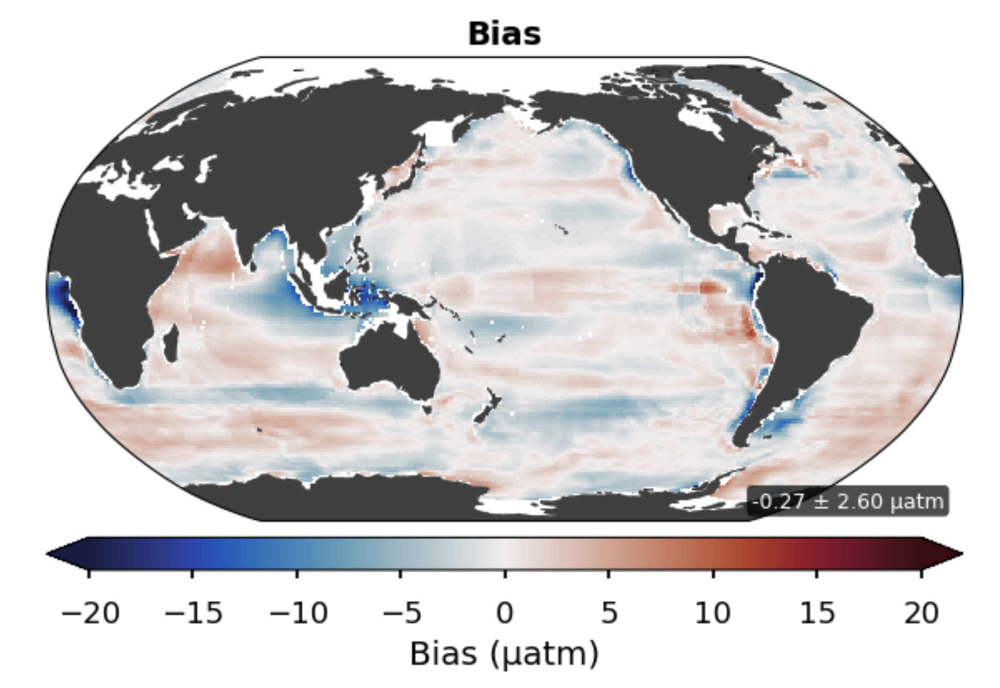

In [49]:
#Now, compare this to our original ensemble bias performnace. 
Image(filename="images/OGensemblebias.png", width=500)

### 8.4 The performance of our reconstruction method between model is bad for MPI, because in the previous study we know that in the MPI model its chlorophyll feature importance is very high, so its more sensitive to any change on chlorophyll.

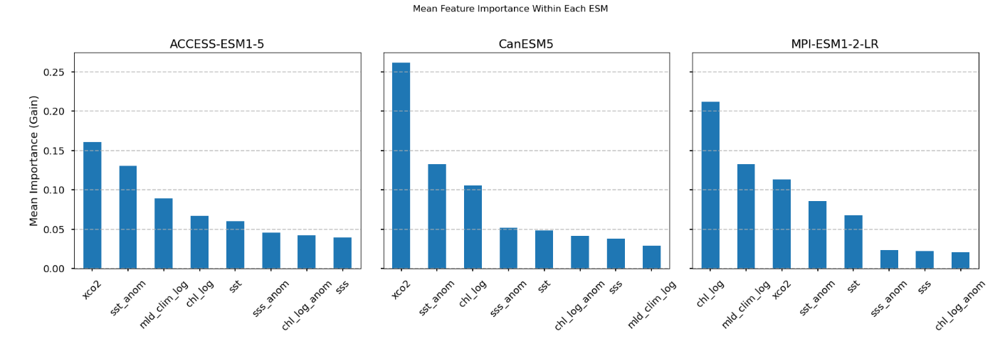

In [46]:
Image(filename="images/meanfeatureimportance.png", width=800)

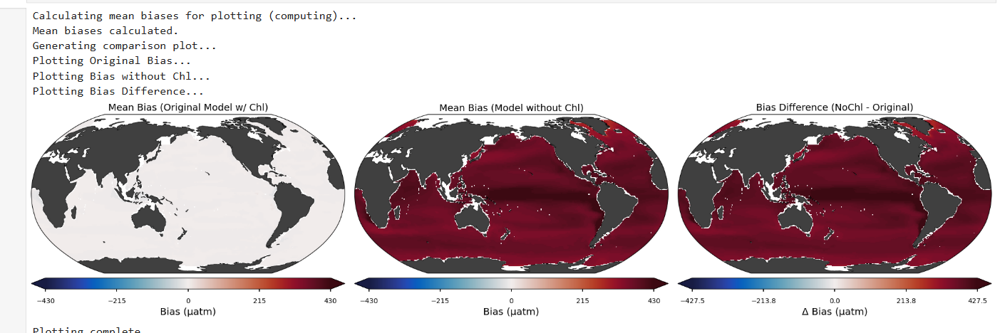

In [47]:
Image(filename="images/meanspatial.png", width=800)

--- Generating Blended Reconstruction Visualizations ---
  Calculating mean reconstruction per ESM...
  Mean reconstruction per ESM calculated.
  Calculating spatially averaged time series...
  Calculating ensemble mean time series...
  Time series calculations complete.

  --- Generating Maps per ESM ---
  Using pCO2 range: 320 to 440
    Plotting blended recon for ACCESS-ESM1-5...
    Plotting blended recon for CanESM5...
    Plotting blended recon for MPI-ESM1-2-LR...

  --- Generating Time Series Plot ---


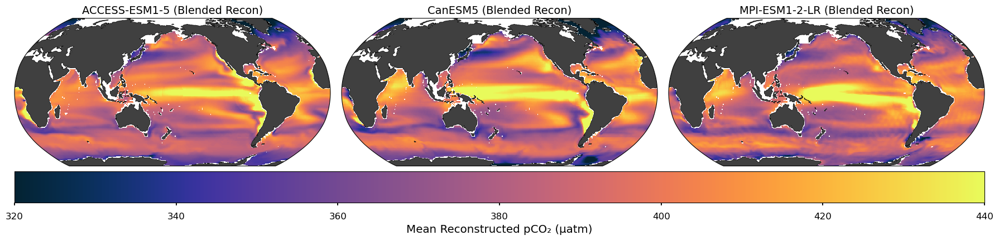

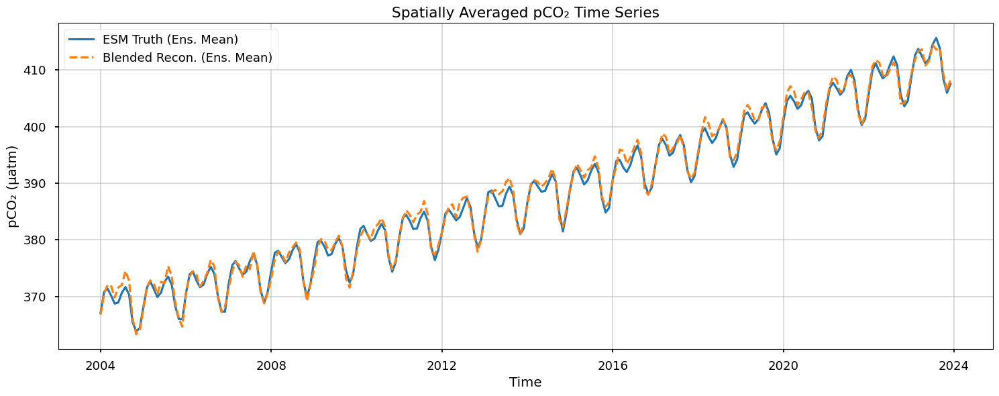


--- All Visualizations Complete ---
Cleaning up visualization variables...


17346

In [42]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import cmocean
import numpy as np
import xarray as xr
from lib.visualization import SpatialMap2, xr_add_cyclic_point # Assuming these are available
import gc

# --- Close any previous plots ---
plt.close('all')

# --- Check if necessary data exists ---
# Make sure 'ds_full_blended' was successfully calculated and loaded in a previous cell
if 'ds_full_blended' in locals() and ds_full_blended is not None:

    print("--- Generating Blended Reconstruction Visualizations ---")
    # Initialize variables
    esm_mean_recon_blended = None; esm_names = None; num_esms = 0
    truth_ensemble_mean_ts = None; recon_ensemble_mean_ts = None

    # --- Perform Calculations First ---
    calculation_successful = True
    try:
        print("  Calculating mean reconstruction per ESM...")
        esm_mean_recon_blended = ds_full_blended['pCO2_recon_full'].mean(dim=['member', 'time'], skipna=True).compute()
        esm_names = esm_mean_recon_blended['ens'].values.tolist()
        num_esms = len(esm_names)
        print("  Mean reconstruction per ESM calculated.")

        print("  Calculating spatially averaged time series...")
        truth_mean_ts = ds_full_blended['spco2'].mean(dim=['ylat', 'xlon'], skipna=True).compute()
        recon_mean_ts = ds_full_blended['pCO2_recon_full'].mean(dim=['ylat', 'xlon'], skipna=True).compute()
        print("  Calculating ensemble mean time series...")
        truth_ensemble_mean_ts = truth_mean_ts.mean(dim=['ens', 'member'], skipna=True)
        recon_ensemble_mean_ts = recon_mean_ts.mean(dim=['ens', 'member'], skipna=True)
        print("  Time series calculations complete.")

    except Exception as e_calc:
        print(f"ERROR during calculations: {e_calc}")
        calculation_successful = False

    # --- Proceed to Plotting if Calculations Succeeded ---
    if calculation_successful and esm_mean_recon_blended is not None and truth_ensemble_mean_ts is not None:

        # === Plot 1: Maps per ESM ===
        print("\n  --- Generating Maps per ESM ---")
        plot_style = "seaborn-v0_8-talk"
        cmap_pco2 = cm.cm.thermal
        vrange_pco2 = [320, 440]; tick_interval_pco2 = 20
        print(f"  Using pCO2 range: {vrange_pco2[0]} to {vrange_pco2[1]}")

        fig_w1 = num_esms * 6; fig_h1 = 6
        plt.style.use(plot_style)
        fig1 = plt.figure(figsize=(fig_w1, fig_h1))
        worldmap1 = SpatialMap2(fig=fig1, region='world',
                               cbar_mode='single', colorbar=True,
                               cbar_location='bottom', nrows_ncols=[1, num_esms])
        sub_list1 = []
        for i, esm_name in enumerate(esm_names):
            print(f"    Plotting blended recon for {esm_name}...")
            try:
                data_esm = esm_mean_recon_blended.sel(ens=esm_name)
                data_plot = data_esm.roll(xlon=len(data_esm.xlon) // 2, roll_coords=True)
                lon = data_plot['xlon'].values; lat = data_plot['ylat'].values; data_np = data_plot.values
                sub = worldmap1.add_plot(lon=lon, lat=lat, data=data_np, vrange=vrange_pco2, cmap=cmap_pco2, ax=i, linewidth_coast=0.5)
                sub_list1.append(sub)
                worldmap1.set_title(f"{esm_name} (Blended Recon)", ax=i, fontsize=14)
            except Exception as e_plot1: print(f"ERROR plotting map for {esm_name}: {e_plot1}")

        # --- Add and Configure the Single Colorbar ---
        if sub_list1 and hasattr(worldmap1.grid, 'cbar_axes') and worldmap1.grid.cbar_axes:
            try:
                # ***** CORRECTED CALL: Use ax=0 *****
                col1 = worldmap1.add_colorbar(sub_list1[0], ax=0, # Use ax=0 for single colorbar axis
                                             label='Mean Reconstructed pCO₂ (µatm)') # Removed extend initially
                # ************************************
                worldmap1.set_ticks(col1, vrange_pco2[0], vrange_pco2[1], tick_interval_pco2)
                col1.ax.tick_params(labelsize=12)
            except Exception as e_cbar1: print(f"ERROR adding/configuring colorbar for maps: {e_cbar1}")
        try: fig1.tight_layout(rect=[0, 0.15, 1, 0.95])
        except: print(f"WARNING: tight_layout failed for maps")

        # === Plot 2: Time Series ===
        print("\n  --- Generating Time Series Plot ---")
        plt.style.use("seaborn-v0_8-talk")
        fig2, ax2 = plt.subplots(figsize=(15, 6))

        try:
            truth_ensemble_mean_ts.plot(ax=ax2, label='ESM Truth (Ens. Mean)')
            recon_ensemble_mean_ts.plot(ax=ax2, label='Blended Recon. (Ens. Mean)', linestyle='--')
            ax2.set_title('Spatially Averaged pCO₂ Time Series')
            ax2.set_ylabel('pCO₂ (µatm)')
            ax2.set_xlabel('Time')
            ax2.legend()
            ax2.grid(True, alpha=0.5)
            fig2.tight_layout()
        except Exception as e_ts_plot: print(f"ERROR generating time series plot: {e_ts_plot}")

        # === Show Plots ===
        plt.show()
        print("\n--- All Visualizations Complete ---")

    else: print("Plotting skipped: Calculation of means failed.")
else: print("Visualizations skipped because blended dataset ('ds_full_blended') is missing or invalid.")

# --- Cleanup ---
print("Cleaning up visualization variables...")
if 'esm_mean_recon_blended' in locals() and esm_mean_recon_blended is not None: del esm_mean_recon_blended
if 'truth_mean_ts' in locals() and truth_mean_ts is not None: del truth_mean_ts
if 'recon_mean_ts' in locals() and recon_mean_ts is not None: del recon_mean_ts
if 'truth_ensemble_mean_ts' in locals() and truth_ensemble_mean_ts is not None: del truth_ensemble_mean_ts
if 'recon_ensemble_mean_ts' in locals() and recon_ensemble_mean_ts is not None: del recon_ensemble_mean_ts
gc.collect()

Although we see a well corresponded blended model data with ESM truth, we also see the significant overall increasing trend of pCO2

# 9. Conclusions and Future Directions
## 9.1 Conclusions on Biotic Factors

## 9.2 Conclusions on Abiotic Factors

### 9.2.1 Peru–Chile Upwelling System

- RMSE is unusually high off South America's west coast due to sparse observations and complex upwelling-driven variability.

- The Peru–Chile upwelling system features sharp gradients and biogeochemical feedbacks that models fail to resolve well.

- ACCESS-ESM models show stronger biases, likely due to coarse resolution and inadequate coastal process parameterization.

### 9.2.2 Benguela Upwelling System (Western Coast of Southern Africa)

- The Benguela Upwelling System (BUS) sees a seasonal cold, DIC-rich upwelling during JJA/SON, often causing underestimation of surface pCO₂ in models.
- MPI-ESM1-2-LR members show strong negative biases in BUS, likely due to overactive upwelling and exaggerated cooling during peak seasons.
- These biases highlight the importance of correcting for both regional dynamics and seasonal variability in surface pCO₂ reconstructions.

### 9.2.3 ENSO Region

Ultimately, it is difficult to determine whether our errors come from model error (Global Climate Model misunderstands Real Earth dynamcis), or observation gaps, or XGBoost generalization of sparse data. This is a classic case of representational error. And yet, we can gleam a few conclusions. 

- Surface pCO₂ seasonality during ENSO is characterized by weaker upwelling during El Niño (lower pCO₂), stronger upwelling during La Niña (higher pCO₂).
- In the ENSO-sensitive eastern tropical Pacific, the biggest seasonal biases often occur in __JJA-SON__ (upwelling seasons) because this is when ENSO variability peaks and data sparsity is worst.

### 9.3 What are our models capturing, or missing?

### +
At the seasonal scale, the models do a surprisingly good job at predicting the residual pCO2 in vast swaths of the ocean based on sparse data with __correlation >0.9__ and __RMSE <10uatm__ in most parts of the ocean. 

The ensembling approach gives us meaningful improvements in stabilizing model performance, reducing the standard deviation of key error metrics (RMSE, Bias) and protected us against the most extreme of model errors (see ACCESS vs. MPI in Section 6.4) 

### –

The models perform extemely poorly in certain regions, with the direction of bias often flipping depending on season. 


Our observation data (SOCAT) is sparse in many areas, and is a general problem over the ocean. However, it becomes a much bigger issue in dynamic regions such as:
- The ENSO region 
- The West Coast of South America (Peru/Chile upwelling system)
- The West Coast of southern Africa (Namibia/Benguela upwelling system)

Why? Because:
- Dyanmically:
    - ENSO dynamics (changing trade winds, thermocline depth) strongly modulate surface pCO₂.
    - Coastal upwelling zones naturally have huge gradients in pCO₂ and biological activity.
- Seasonally:
    - Upwelling tends to peak seasonally (e.g. JJA along west South America and southern Africa).
    - ENSO events develop seasonally (spring/summer onset, fall/winter peak), shifting the baseline pCO₂ patterns.

Given our spatial / temporal sparseness in observation data, our XGBoost models are foreced to make a "guess in the dark" about the important phenomena that governs the interseasonal variability of pCO2 exchange between the atmosphere and the surface ocean.


### 9.4 Future Directions

Coastline dynamics-informed model formulation would help models understand and adapt to the changing influence of ocean upwelling near the coastlines. Further observation voyages, especially to the areas off the coast of S. America (Peru, Ecuador) and Africa (Gabon, Angola) are imperative to improving our understanding of the pCO2 regime of the global ocean. In this process, we must continue to improve our understanding of the role chlorophyll plays as an important modulator for near-surface pCO2. 

# 10. References and Acknowledgements

This Python-based JupyterNotebook and associated utility files have been developed for Project 3 in the course EESC4243/STAT4243/5243 "Climate Prediction Challenges with Machine Learning", Professor Galen McKinley in DEES and Professor Tian Zheng in Statistics, Spring 2025 at Columbia University. The course is also a contribution from the NSF-supported LEAP STC and is intended to run on the LEAP-Pangeo cloud computing and data system. The Github repository for this course is at https://github.com/leap-stc/LEAPCourse-Climate-Pred-Challenges

Code developed by Course TA Xinyi Ke and Professor Galen McKinley, following from prior work from Dr. Thea Heimdal and Abby Shaum


Additional references in which these methods are employed\
**Heimdal et al. (2024)** *"Assessing improvements in global ocean pCO₂ machine learning reconstructions with Southern Ocean autonomous sampling."* **Biogeosciences** 21: 2159–2176.  
([DOI: 10.5194/bg-21-2159-2024](https://doi.org/10.5194/bg-21-2159-2024))\
**Heimdal, T. H., & McKinley, G. A. (2024)** *"The importance of adding unbiased Argo observations to the ocean carbon observing system."* **Scientific Reports**, 14(1), 19763. ([DOI: 10.1038/s41598-024-70617-x](https://doi.org/10.1038/s41598-024-70617-x) )


We would like to express gratitiude for the continued support of Prof. McKinley, Prof. Zheng, TA Xinyi that made this project class possible.